# Intro

Check the readme files in the folder to learn how to run scans and use defaults vs specify parameters

# Initialize

In [4]:
cfg_file='ll.yml'
expt_path = 'C:\\_Data\\ll\\'

ip = '192.168.137.1'
ip = '10.108.30.23'
max_t1 = 250

## Imports

In [5]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from tqdm.notebook import tqdm

from qick import QickConfig

from slab_qick_calib.exp_handling.instrumentmanager import InstrumentManager
import slab_qick_calib.experiments as meas
from slab_qick_calib.calib import qubit_tuning, measure_func
from slab_qick_calib.helpers import handy
from slab_qick_calib.calib.time_tracking import time_tracking

%load_ext autoreload
%autoreload 2

# Set color palette and font size
handy.config_figs()

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


## Set up new config 
Set to variables to True when setting up a new experiment config file. 

Note: make sure you set your ADC/DAC channels correctly. This code does not automatically fill in the ADC/DAC into your configuration file, so you should check yourself to make sure these values are correct. 

There are several elements that you may want to customize based on your readout parameters and coherence times. Check readme file config_manual.md

In [6]:
# Set to false if you aren't creating a new one
new_config = False
new_folder = False

nqubits = 6
rfsoc_alias = 'bf3_soc'
t1_guess = 150 

import os
from slab_qick_calib.helpers import config

configs_dir = os.path.join(os.getcwd(),'../', 'configs')

cfg_file_path = os.path.join(configs_dir, cfg_file)
images_dir = os.path.join(expt_path, 'images')
summary_dir = os.path.join(images_dir, 'summary')

if new_config or new_folder:
    if new_config:
        config.init_config(cfg_file_path, nqubits, type='full', aliases=rfsoc_alias, t1=t1_guess)

    if not os.path.exists(expt_path):
        os.makedirs(expt_path)
        os.mkdir(images_dir)
        os.mkdir(summary_dir)

print('Data will be stored in', expt_path)

Data will be stored in C:\_Data\ll\


## Connect to RFSoC
Before running first cell, make sure a nameserver is running on the network, the Qick board is connected to it, and the ip address listed below matches that of the nameserver. 

You just need to run the first cell, then should be able to run any other cell in whatever order. 

If you need to restart the RFSoC, you should reconnect it to the nameserver and rerun this. 

In [7]:
# Results config file
cfg_path = os.path.join(os.getcwd(),'..', 'configs', cfg_file)
auto_cfg = config.load(cfg_path)

# Connect to instruments
im = InstrumentManager(ns_address=ip)
print(im)
soc = QickConfig(im[auto_cfg['aliases']['soc']].get_cfg())
#print(soc)

cfg_dict = {'soc': soc, 'expt_path': expt_path, 'cfg_file': cfg_path, 'im': im}

QICK library version mismatch: 0.2.354 remote (the board), 0.2.363 local (the PC)
                        This may cause errors, usually KeyError in QickConfig initialization.
                        If this happens, you must bring your versions in sync.


{'Pyro.NameServer': <Pyro4.core.Proxy at 0x17c99d030e0; not connected; for PYRO:Pyro.NameServer@10.108.30.23:9090>, 'bf3_soc': <Pyro4.core.Proxy at 0x17c99d27fe0; not connected; for PYRO:obj_154b0eb4cc1c47a99d61b5c8d8dc9317@10.108.30.27:36227>}


## How to update config (you can also just edit yml directly)

In [ ]:
# #                                          param   value qubit #
# auto_cfg = config.update_readout(cfg_path, 'lamb', 5, qi)
# auto_cfg = config.update_qubit(cfg_path, 'f_ge', 5700, qi)

# # For multiple levels of nesting: 
# auto_cfg = config.update_qubit(cfg_path, ('pulses','pi_ge','gain'), 0.2, qi)

## Print scan params

In [ ]:
t1 = meas.T1Experiment(cfg_dict, qi=0, print=True)

reps: 300
rounds: 1
expts: 60
start: 0
span: 427.165
acStark: False
active_reset: False
qubit: [0]
qubit_chan: 0


In general, all scans will be interacted with either by running default, or giving arguments from params dict. 
You can run scans on list of different qubits or just one by adding first couple lines of each cell. 
Flag of update is used to decide if to set new config vals based on output of scan (if the fit looks good)

## Check QICK issues

### Check mirror frequencies on qubit

In [7]:
from slab_qick_calib.helpers import qick_check
qick_check.check_freqs(0, cfg_dict)

Nyquist frequency: 4915.2 MHz
Possible g-e frequencies: 3585.2348 MHz and 6245.1651999999995 MHz
Possible e-f frequencies: 3437.1538 MHz and 6393.2462 MHz
Anharmonicity: 148.08100000000013 MHz. With aliased e-f: -2808.0113999999994 MHz
Aliased e-f frequency is greater than both g-e frequencies.
Recommendation: Current e-f frequency is the correct choice.


### Check mirror frequencies from resonators

In [8]:
from slab_qick_calib.helpers import qick_check
qick_check.check_resonances(cfg_dict)

Nyquist frequency: 4915.2 MHz
Configured resonator frequencies (MHz):
[7144.7277 7174.3805 7000.     7246.6119 7247.044  7000.    ]
Aliased resonator frequencies (MHz):
[2685.6723 2656.0195 2830.4    2583.7881 2583.356  2830.4   ]


### Check sampling rates and minimum point spacing

In [9]:

fnyq = cfg_dict['soc']._get_ch_cfg(ro_ch=0)['f_dds']/2
clock_tick = 1e3*cfg_dict['soc'].cycles2us(1)
print(f'ADC Nyquist frequency is {fnyq} MHz')
print(f'1 clock tick is {clock_tick} ns')

ADC Nyquist frequency is 2211.84 MHz
1 clock tick is 1.6276041666666667 ns


In [10]:
from slab_qick_calib.helpers import qick_check

# Assuming 'soc' is your QickSoc object
dac_channel = qick_check.get_ch(soc, '0_228', type='dac')
print(f'DAC channel for 0_228 is: {dac_channel}')
from slab_qick_calib.helpers.qick_check import get_ch, print_dac_channels, print_adc_channels

print_dac_channels(cfg_dict['soc'])

DAC channel for 0_228 is: None
DAC Channels:
  0: DAC_B
  1: DAC_A


### Make sure you're not near the nyquist frequency of the ADC

In [11]:
from slab_qick_calib.helpers import qick_check
qick_check.check_adc(cfg_dict)

ADC sampling frequency: 4423.68


# Time of Flight (TOF)

TOF measures the time it takes for the signal to run through the wires. It will give us the time in clock ticks that we should wait to make a measurements 

 Use this to set trig_offset in config file

  0%|          | 0/1000 [00:00<?, ?it/s]

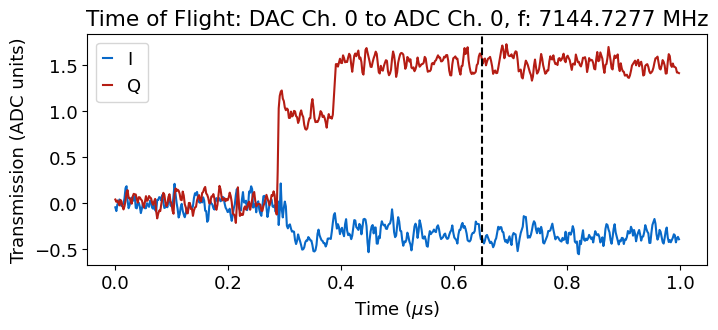

In [12]:
qubit_list = np.arange(3)
qubit_list = [0]
for qi in qubit_list:  
        tof=meas.ToFCalibrationExperiment(cfg_dict=cfg_dict, qi=qi)

        # Set frequency of choice and readout length (up to 13 us for standard ZCU216 firmware, readout)
        #tof=meas.ToFCalibrationExperiment(cfg_dict=cfg_dict, qi=qi,params={'readout_length':13})#,params={'frequency':fi})

## Set trig_offset to point where signal has appeared, usually around 300-500 ns

In [13]:
qubit_list=np.arange(3)
for qi in qubit_list: 
    auto_cfg = config.update_readout(cfg_path, 'trig_offset', 0.65, qi)

*Set cfg device.readout 0 trig_offset to 0.65 from 0.45*
*Set cfg device.readout 1 trig_offset to 0.65 from 0.45*
*Set cfg device.readout 2 trig_offset to 0.65 from 0.45*


## Collect many time traces of TOF data (for examining measurement data)

check_e first prepares e state

In [14]:
tof2d = meas.ToF2D(cfg_dict=cfg_dict, qi=qi, params={'expts_count':10000, 'readout_length': 13})
tof2d = meas.ToF2D(cfg_dict=cfg_dict, qi=qi, params={'expts_count':10000, 'readout_length': 13,'check_e':True})

  0%|          | 0/10000 [00:00<?, ?it/s]

KeyboardInterrupt: 

# Resonator Spectroscopy 

Run resonator spectroscopy for all resonators by choosing a large frequency scan to look over. The scan will then find the different resonators and fill in the config file with their respective frequencies. In the autocalibration, there will be a finer sweep of each resonator to more accurately find its frequency. The frequencies are saved in <code>auto_cfg.device.readout.frequency</code>

## Coarse 

This will perform peak finding
Use params to specify frequency range, averaging, gain, expts. 
If gain is too high, you may be in punch out region, where resonators disappear, or above it 

  0%|          | 0/5000000 [00:00<?, ?it/s]

Number of peaks: 0


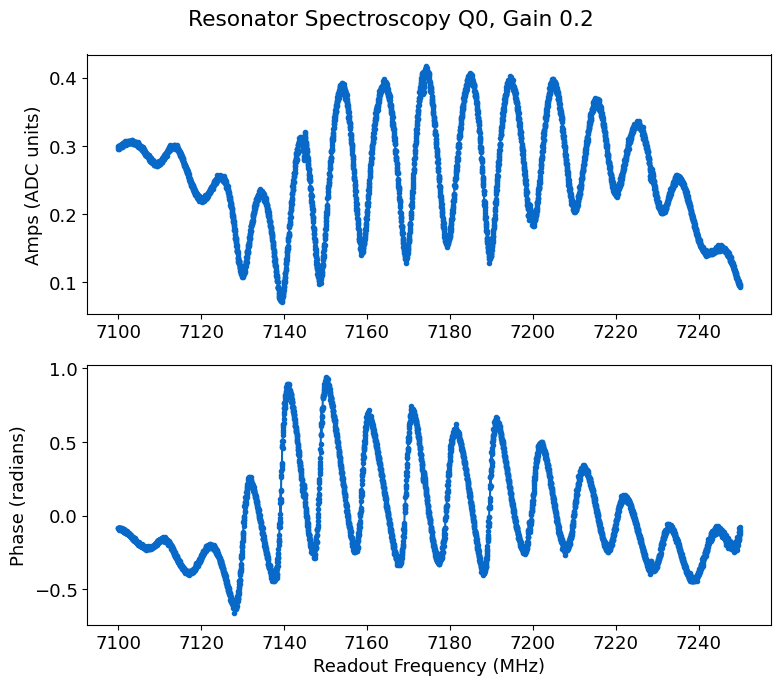

In [9]:
qi=0 # We only run this once for all qubits on a single feedline, this is a dummy value to make the scan work 
params={'start':7100, 'span':150, 'reps':1000, 'gain':0.2, 'expts':5000}
rspecc = meas.ResSpec(cfg_dict, qi=qi, style='coarse', progress=True, params=params)
res_values = rspecc.data['coarse_peaks']

Change prom (prominence value) to adjust how many peaks you find

Number of peaks: 5


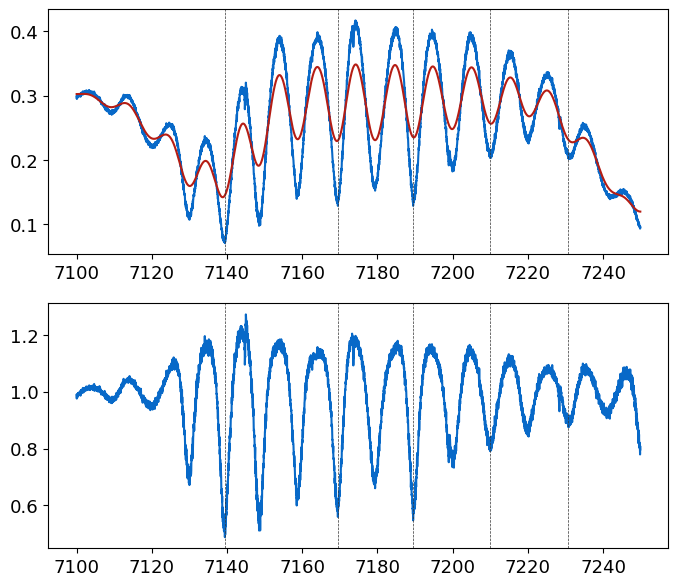

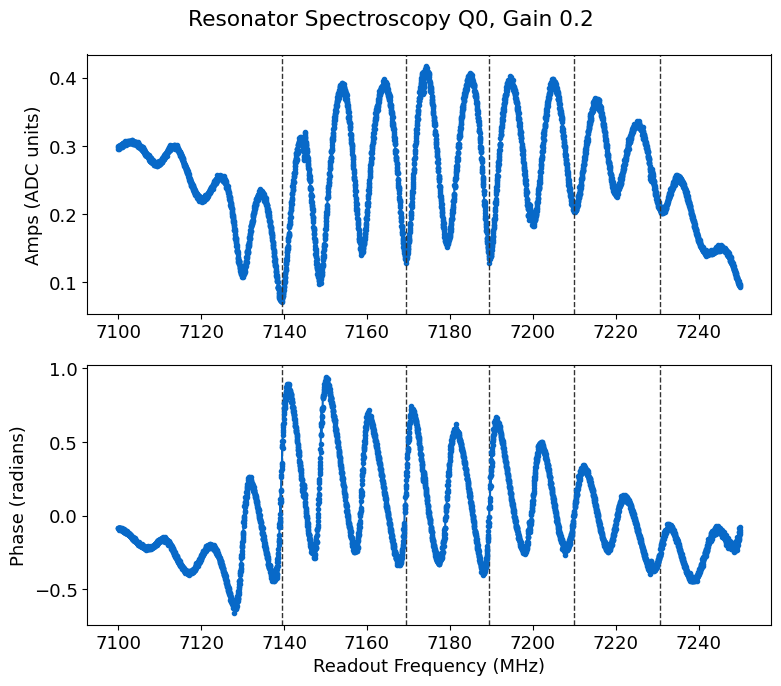

In [10]:
rspecc.analyze(peaks=True, debug=True, fit=False, prom=0.2)
rspecc.display(peaks=True, fit=False)
res_values = rspecc.data['coarse_peaks']

In [69]:
res_values

array([7103.18897095, 7125.03663712, 7145.43445816, 7174.48135529,
       7204.82811356, 7225.57589722, 7246.87362213, 7266.17156067])

Can delete values from res_values if they don't seem to be real res_values. 

In [72]:
res_values = np.delete(res_values, 0)

## Fine

This will fit the resonance amplitude

Can run scan with default options, or specify your own, by commenting out different lines and editing paramters. 

### First time after running coarse scan, using res_values list
Assumes you have the same number of res_values as qubits. 
First time you run scan, plot will appear weird first because it plots the resonator frequency in the config on the same plot. Just run again

  0%|          | 0/33000 [00:00<?, ?it/s]

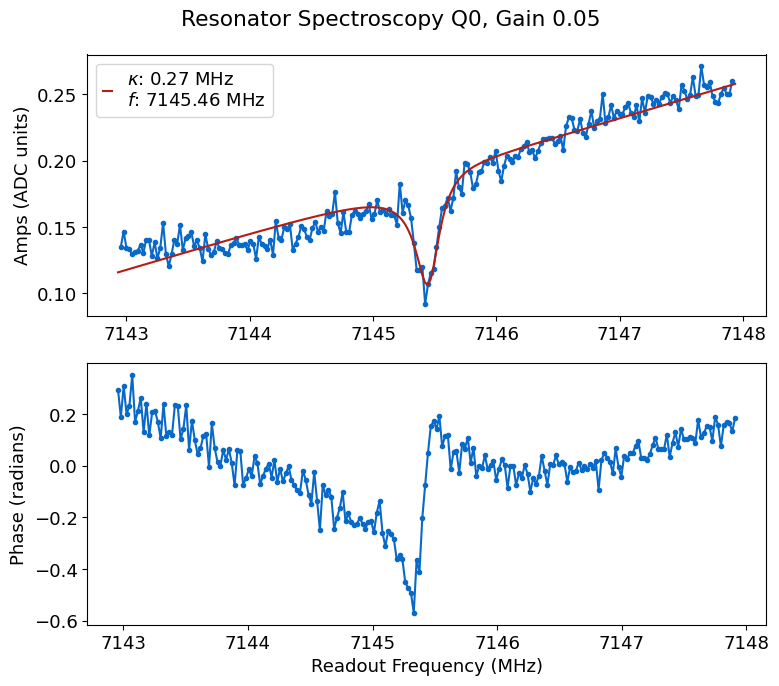

*Set cfg device.readout 0 frequency to 7145.4223 from 7000*
*Set cfg device.readout 0 kappa to 0.2727 from 0.5*
*Set cfg device.readout 0 qi to 4.6573 from 0*
*Set cfg device.readout 0 qe to 5.9895 from 0*


  0%|          | 0/33000 [00:00<?, ?it/s]

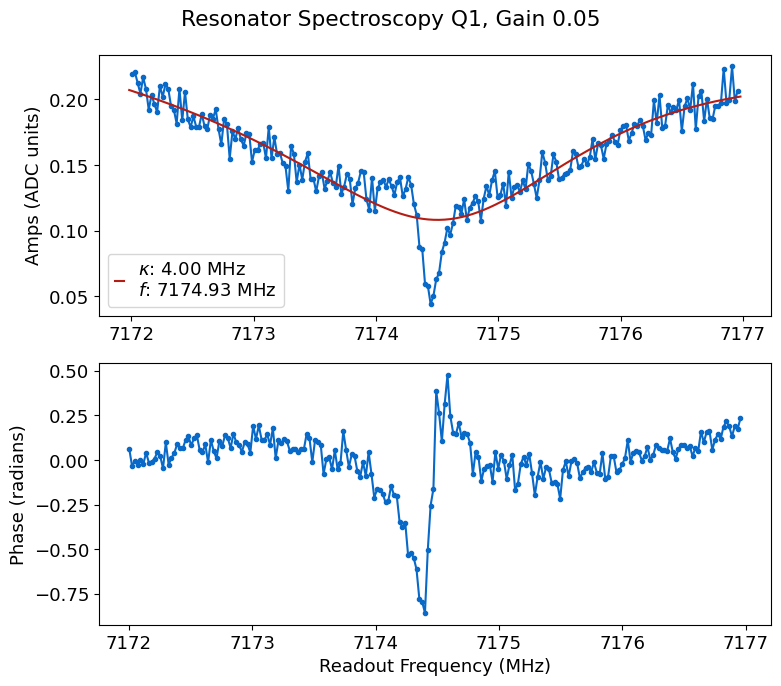

*Set cfg device.readout 1 frequency to 7174.4464 from 7000*
*Set cfg device.readout 1 kappa to 3.995 from 0.5*
*Set cfg device.readout 1 qi to 0.4411 from 0*
*Set cfg device.readout 1 qe to 0.3029 from 0*


  0%|          | 0/33000 [00:00<?, ?it/s]

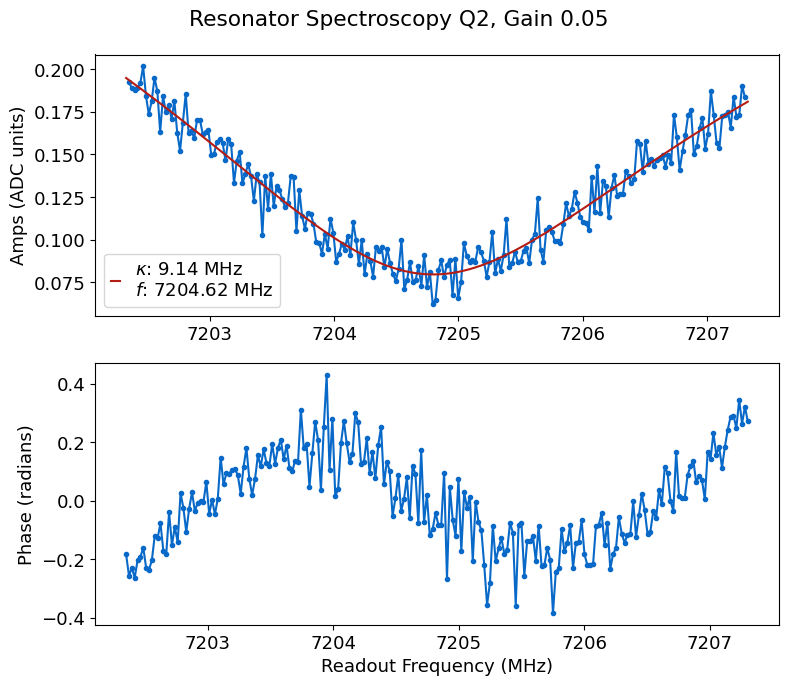

  0%|          | 0/33000 [00:00<?, ?it/s]

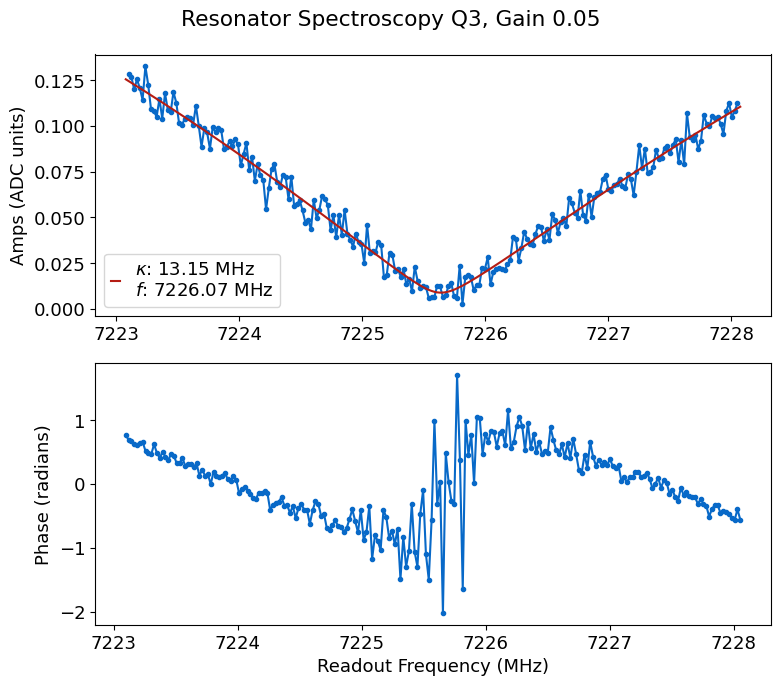

*Set cfg device.readout 3 frequency to 7225.8148 from 7000*
*Set cfg device.readout 3 kappa to 13.1464 from 0.5*
*Set cfg device.readout 3 qi to 2.6834 from 0*
*Set cfg device.readout 3 qe to 0.0561 from 0*


  0%|          | 0/33000 [00:00<?, ?it/s]

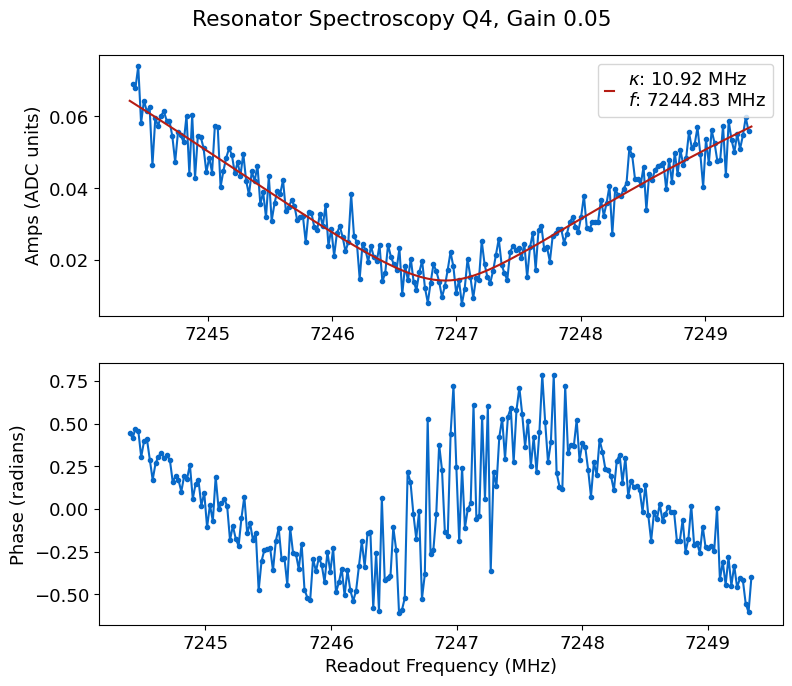

*Set cfg device.readout 4 frequency to 7247.044 from 7000*
*Set cfg device.readout 4 kappa to 10.9174 from 0.5*
*Set cfg device.readout 4 qi to 351624.1232 from 0*
*Set cfg device.readout 4 qe to 0.0664 from 0*


  0%|          | 0/33000 [00:00<?, ?it/s]

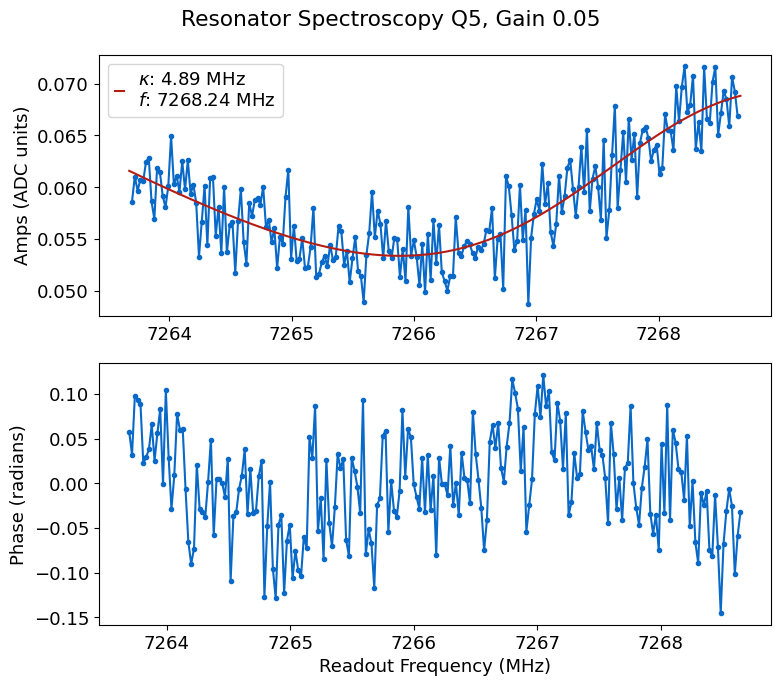

In [ ]:
update=True

num_peaks = len(res_values)

for qi in range(len(res_values)):    
    # Used for initial finding of resonance 
    rspec = meas.ResSpec(cfg_dict, qi=qi, params={'span':5, 'center':res_values[qi]}, disp_kwargs={'plot_res':False})

    if update: rspec.update(cfg_dict['cfg_file'])

### Fine resonator scan

Once the correct frequencies are saved to your config file. 

  0%|          | 0/55000 [00:00<?, ?it/s]

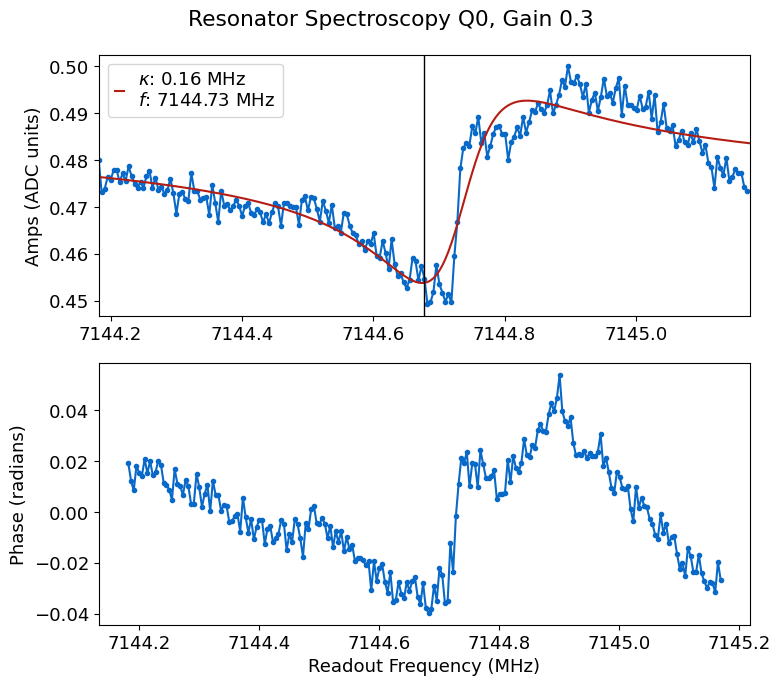

*Set cfg device.readout 0 frequency to 7144.6826 from 7144.6773*
*Set cfg device.readout 0 kappa to 0.1559 from 0.2015*
*Set cfg device.readout 0 qi to 4.9962 from 3.8657*
*Set cfg device.readout 0 qe to 55.5096 from 42.9419*


In [12]:
update=True # Set to true if you want to update the config file with the new resonance values

# comment out one of these 
qubit_list = np.arange(3)
qubit_list=[0]

for qi in qubit_list:    
    # Manually set the span and gain 
    rspec = meas.ResSpec(cfg_dict, qi=qi, params={'span':1, 'gain':0.3})

    # Fully automated, using previous fit to kappa to set span
    #rspec = meas.ResSpec(cfg_dict, qi=qi, params={'span':'kappa'})
    if update: rspec.update(cfg_dict['cfg_file'])

### Print out scan params

In [ ]:
rspec.print()

## Resonator Power Spectroscopy 

Find a good value for gain to park your readout at until you run readout optimization. From the 2D sweep that is produced, choose a value for gain that is right before the resonator punches out. Want to choose a high value for gain because we want to be in the shot noise limited regime which increases our signal:noise ratio. 

Setting up a new session...


  0%|          | 0/30 [00:00<?, ?it/s]

High power peak [MHz]: 7141.4896
Low power peak [MHz]: 7141.5342
Lamb shift [MHz]: -0.0446


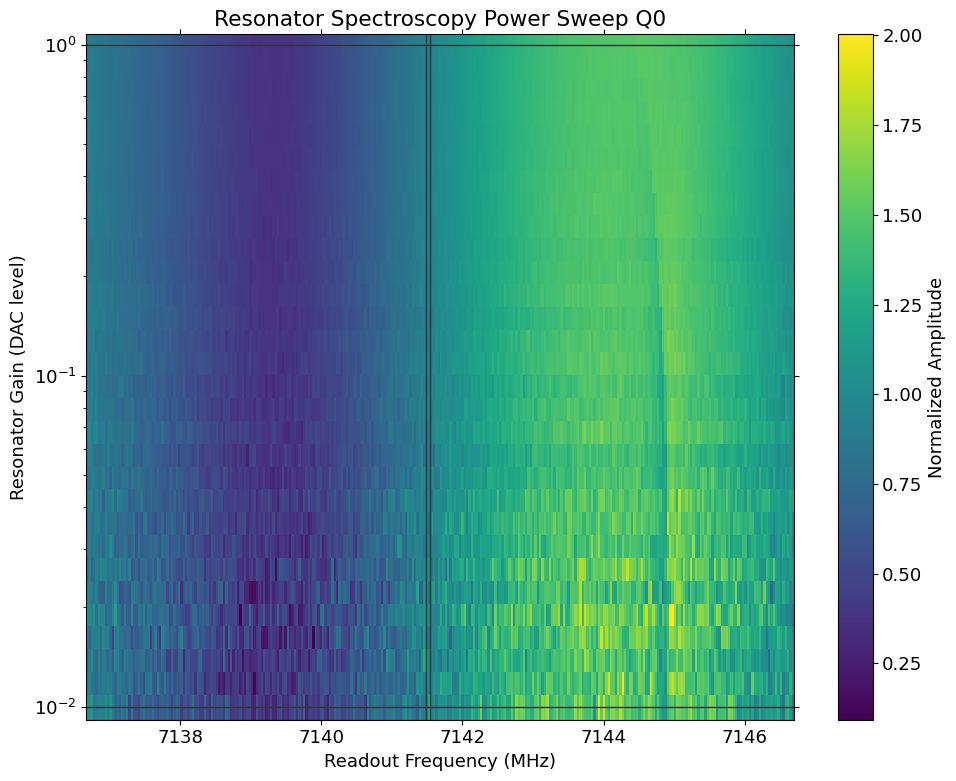

*Set cfg device.readout 0 lamb to -0.0446 from -0.1199*


In [25]:
update=True

qubit_list = np.arange(3)
qubit_list=[0]

d=[]
for qi in qubit_list:
    #rpowspec=meas.ResSpecPower(cfg_dict, qi=qi)
    params={'rng':100,'max_gain':1, 'span':10,"f_off":3,'expts_gain':30}
    rpowspec=meas.ResSpecPower(cfg_dict, qi=qi, params=params, live_plot=True)
    d.append(rpowspec)
    if update:
        auto_cfg = config.update_readout(cfg_path, 'lamb', rpowspec.data['lamb_shift'], qi)

### Example of plotting 2D scans for a bunch of qubits together
Can also use for varying a parameter on one qubit and plotting the results together

In [ ]:
auto_cfg = config.load(cfg_path)
horz_line = auto_cfg.device.readout.gain
handy.plot_many(d, title='Resonator Power', save_path=cfg_dict['expt_path'], chan='amps', yax='log', norm=True, horz_line=horz_line)

### Save gain values 

In [ ]:
# assign the resonator gain to the results config file
gain_values = [0.1,0.01]
for i, qi in enumerate(qubit_list):
    auto_cfg = config.update_readout(cfg_file, 'gain', gain_values[i], qi)

# Qubit Spectroscopy

## Find qubits
More automated, zooms out and adds power if no peak visible. Best to use if you're feeling confident, otherwise use more manual stuff in next cell. 

Performing medium scan


  0%|          | 0/50000 [00:00<?, ?it/s]

R2:0.028	Fit par error:0.327	 Best fit:b'avgi'


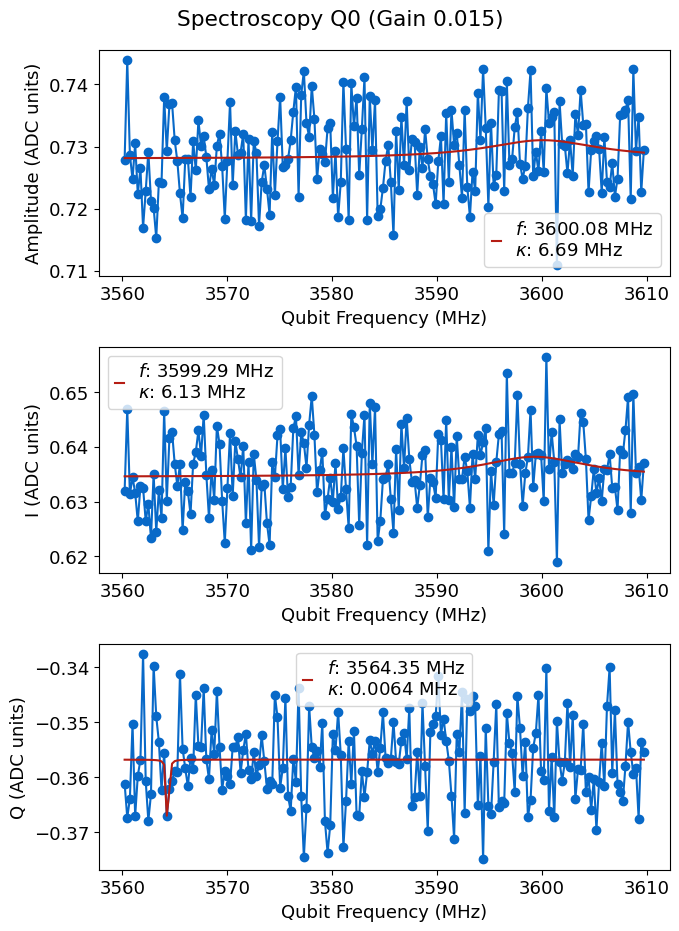

Performing coarse scan


  0%|          | 0/125000 [00:00<?, ?it/s]

R2:0.023	Fit par error:0.252	 Best fit:b'avgi'


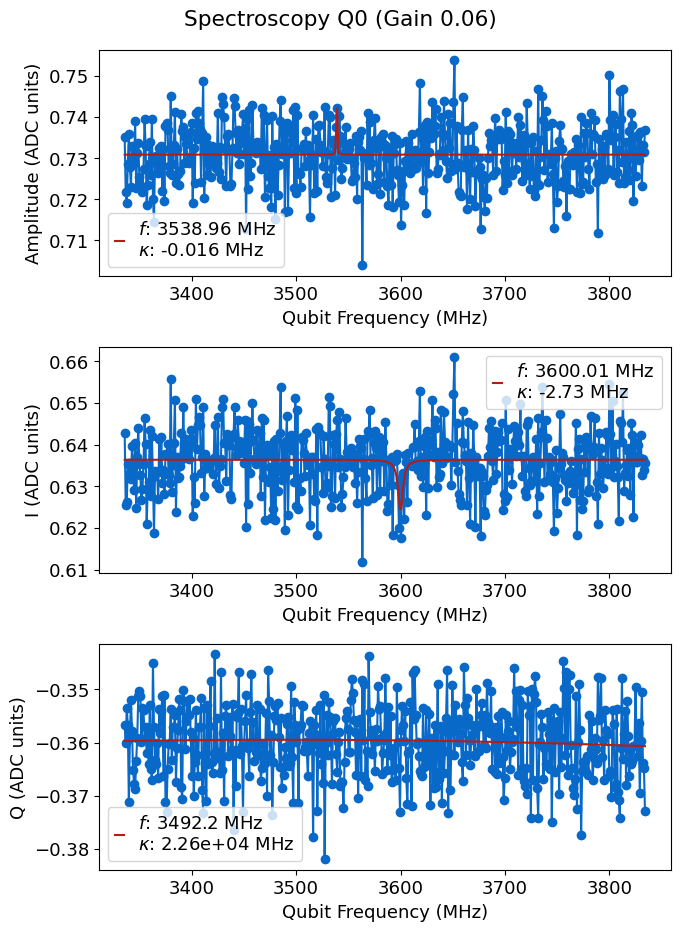

Performing huge scan


  0%|          | 0/250000 [00:00<?, ?it/s]

C:\_Lib\python\qq\slab_qick_calib\experiments\general\qick_experiment.py:807: OptimizeWarning: Covariance of the parameters could not be estimated
  popt, pcov = curve_fit(helpers.two_gaussians, bin_centers, hist, p0=p0)


R2:0.003	Fit par error:0.523	 Best fit:b'avgq'


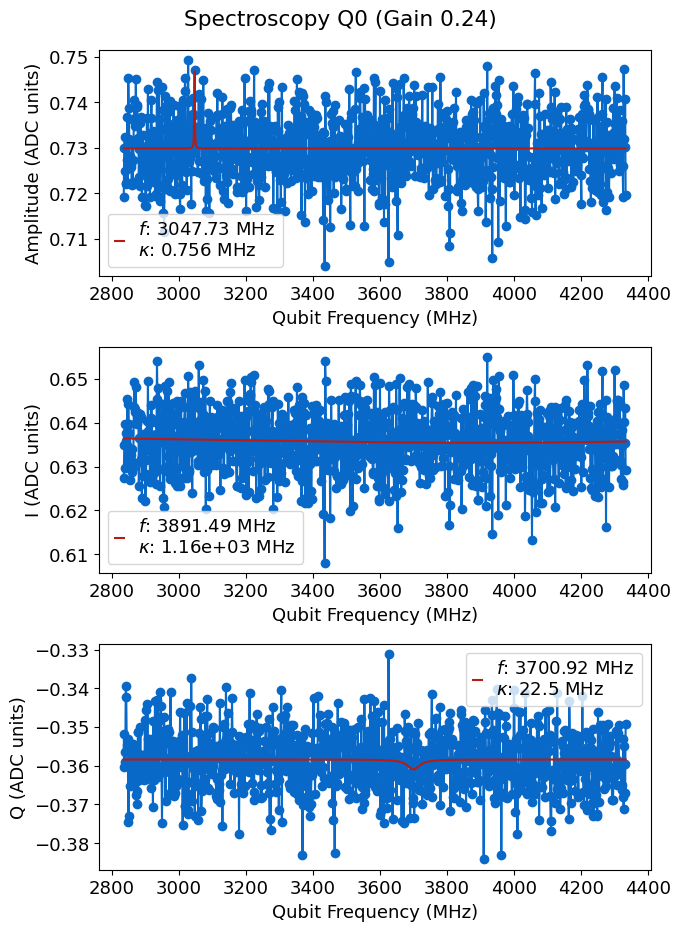

Coarsest scan failed, adding more power and reps
*Set cfg device.readout 0 reps to 2 from 1*
*Set cfg device.qubit 0 spec_gain to 2 from 1*
Performing huge scan


  0%|          | 0/500000 [00:00<?, ?it/s]

R2:0.019	Fit par error:0.177	 Best fit:b'avgq'


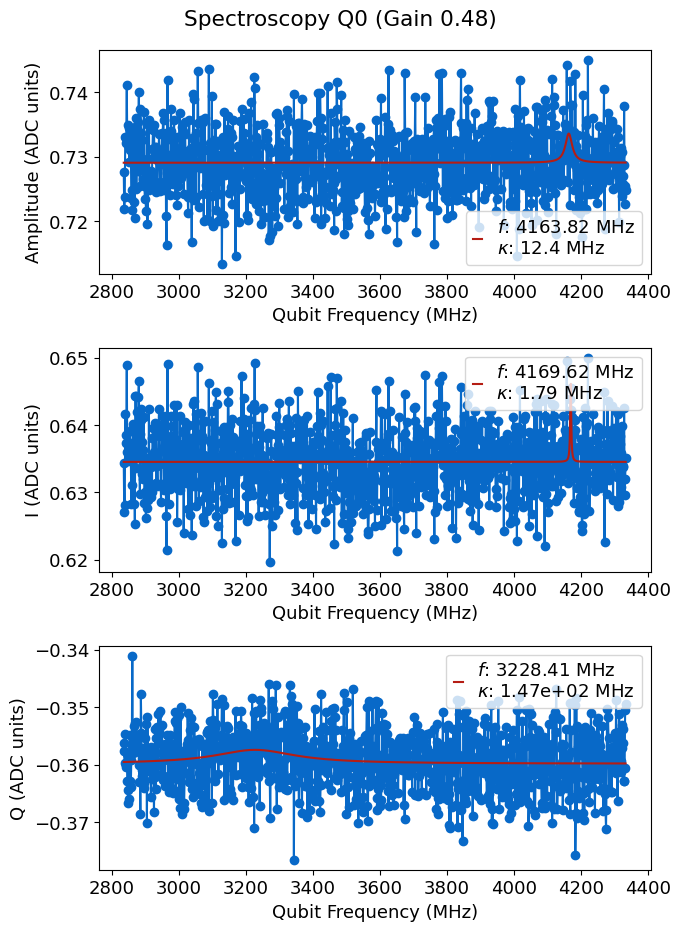

Coarsest scan failed, adding more power and reps
*Set cfg device.readout 0 reps to 4 from 2*
*Set cfg device.qubit 0 spec_gain to 4 from 2*
Performing huge scan


  0%|          | 0/1000000 [00:00<?, ?it/s]

KeyboardInterrupt: 

In [20]:
qubit_list = np.arange(3)
qubit_list= [0]

bad_qubits=[]
for qi in qubit_list:
    status, ntries = qubit_tuning.find_spec(qi, cfg_dict, start='medium')
    if not status:
        bad_qubits.append(qi)

## General search, specify width 

style options: fine, medium, coarse, huge (will change scan width and power)

Uses config values of low_gain (gain to use for finest scan), which sets overall gain for device and spec_gain (set indepedently for each qubit) to decide how much power to apply

You may also just want to do this fully manually by specifiying params. 

  0%|          | 0/200000 [00:00<?, ?it/s]

R2:0.892	Fit par error:0.029	 Best fit:b'avgq'


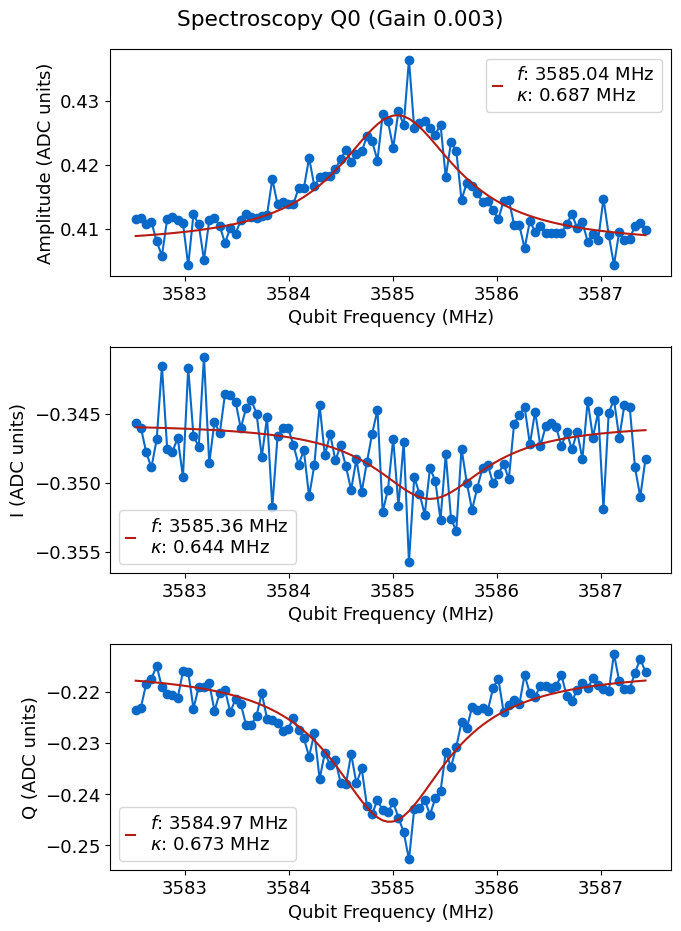

*Set cfg device.qubit 0 f_ge to 3584.9699 from 3584.9793*
*Set cfg device.qubit 0 kappa to 1.3467 from 1.5264*


In [32]:
update=True

#qubit_list = np.arange(3)
qubit_list = [0]

for qi in qubit_list: 
    # Default params, just specify style 
    #qspec=meas.QubitSpec(cfg_dict, qi=qi, style='medium')

    # Different examples of params you might give; frequency can be specified as start and span or if no start given, center is f_ge from config
    qspec=meas.QubitSpec(cfg_dict, qi=qi, style='fine')
    #params={'start':3300, 'span':500, 'gain':0.3}
    #params={'span':3,'expts':100,'gain':0.1,'sep_readout':True, 'length':3, 'readout_length':10, 'reps':10000}
    #qspec=meas.QubitSpec(cfg_dict, qi=qi, style='coarse', params=params)
    if update and qspec.status: 
        auto_cfg = config.update_qubit(cfg_path, 'f_ge', qspec.data["best_fit"][2], qi)
        auto_cfg = config.update_qubit(cfg_path, 'kappa',2*qspec.data["best_fit"][3], qi)
    elif update:
        print(f'Bad qubit! qi={qi}')

## Stark (still getting it working)

In [ ]:
qi=2
qspec=meas.StarkSpec(cfg_dict, qi=qi, style='medium', params={'df_stark':0, 'max_stark_gain':0.2, 'df':-55,'span':130, 'stark_expts':50,'stark_rng':50})

## Power sweep

  0%|          | 0/10 [00:00<?, ?it/s]

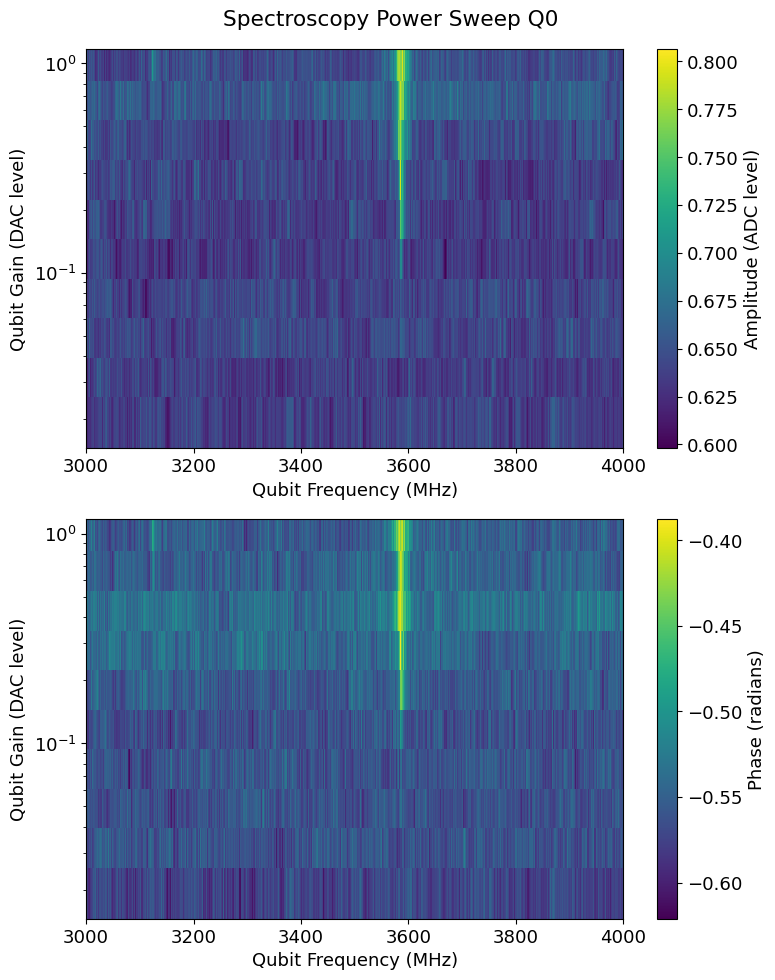

In [ ]:
qubit_list=[0]

for qi in qubit_list:
    #params={'start':3000,'span':1000,'expts':1000}
    qspec_pow = meas.QubitSpecPower(cfg_dict, qi=qi, style='', params=params)
    #qspec_pow = meas.QubitSpecPower(cfg_dict, qi=qi, style='', params={'start':3700,'span':600,'reps':1500,'expts':1200, 'max_gain':0.4, 'length':1,'sep_readout':True})

### Sweep pulse length 
Useful when t1 low

sep_readout = False measures at same time as probe pulse (default is True)

In [ ]:
length = [1,3,5,10]
for l in length:
    for qi in qubit_list:
        params={'start':3700,'span':600,'reps':1500,'expts':1200, 'max_gain':0.4, 'length':1,'sep_readout':True}
        params={'start':5320,'span':100,'reps':1000,'expts':200,'length':l}
        qspec_pow = meas.QubitSpecPower(cfg_dict, qi=qi, style='', params=params)
        #qspec_pow = meas.QubitSpecPower(cfg_dict, qi=qi, style='', params=params)

### Narrow scan

Setting up a new session...


  0%|          | 0/10 [00:00<?, ?it/s]

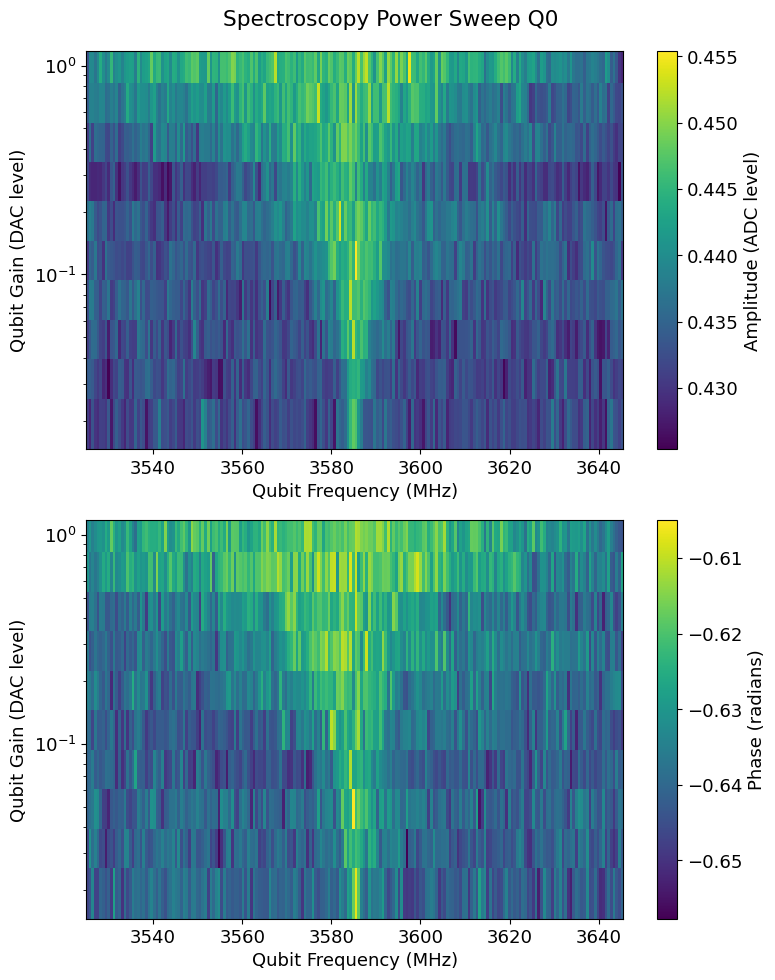

In [34]:
qq=[]

# qubit_list = np.arange(3)
qubit_list=[0]
for qi in qubit_list:
    qspec_pow = meas.QubitSpecPower(cfg_dict, qi=qi, style='narrow', live_plot=True)
    
    # Nice for pretty pics once you have T1 measurement. 
    #qspec_pow = meas.QubitSpecPower(cfg_dict, qi=qi, style='fine', params={'length':'t1','max_gain':1})
    qq.append(qspec_pow)

# When measuring many qubits, can do a bunch of color plots this way
#handy.plot_many(qq, title='Qubit Power Amps 0.6-0.2', save_path=cfg_dict['expt_path'], yax='log', chan='amps')
#handy.plot_many(qq, title='Qubit Power Phase 0.6-0.2', save_path=cfg_dict['expt_path'], yax='log', chan='phases')

### Multiple wide scans looking for qubit

In [ ]:
qubit_list = np.arange(3)
qubit_list=[1]

span = 250
start_all = [2000, 3100, 3400]
end_all = [4780, 3700, 4250]
sensitivities = [0.8, 0.4, 0.2]

d = []
for qi in tqdm(qubit_list, desc='Qubit Number'):
    starts = np.arange(start_all[qi], end_all[qi], span)
    qresults = []
    for start in tqdm(starts, desc=f'Start Frequency Sweep'):
        q_res = meas.QubitSpecPower(
            cfg_dict, 
            qi=qi, 
            style='coarse', 
            params={
                'max_gain':0.8,
                'start':start,
                'span':span,
                'rng':100,
                'reps':800}
        )#,'start':3000,'span':300'})
        qresults.append(q_res)
    
    # Handy plot
    handy.plot_many_limited(
        qresults, 
        title=f'Qubit Power for qubit {qi}', 
        save_path=cfg_dict['expt_path'],
        yax='log', 
        chan='amps', 
        individial_fig_size= (6,6), 
        xlabel='Frequency (MHz)',
        sensitivity =  sensitivities[qi],
        save = False,
    )
    d.append(q_res)
    plt.show()

# Coherent scans

## Fast tuneup

Options are: 

first_time: assume we don't know t1 time,don't have single shot working

single: do single shot readout optimization 

readout: set readout frequency based on resonator fit

  0%|          | 0/55000 [00:00<?, ?it/s]

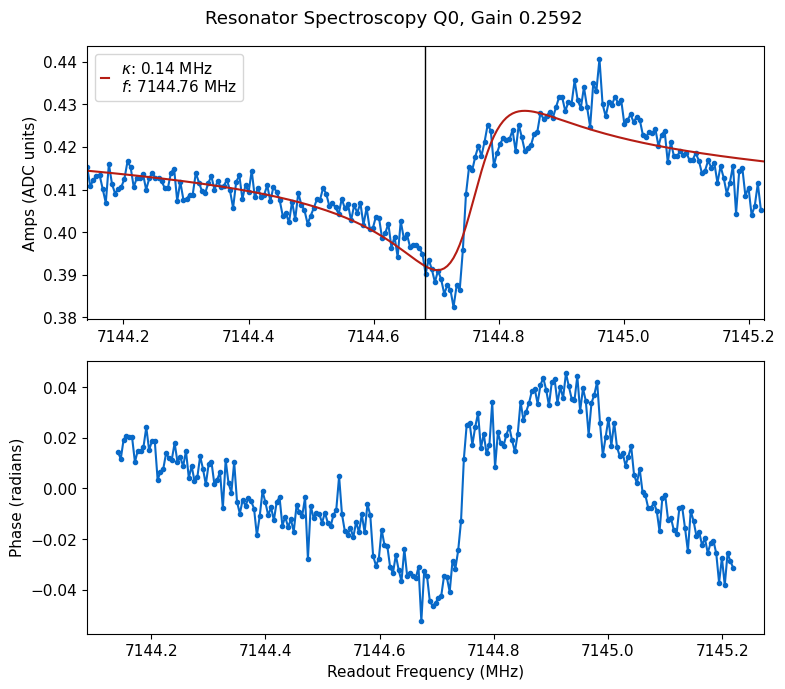

*Set cfg device.readout 0 frequency to 7144.7277 from 7144.6826*
*Set cfg device.readout 0 kappa to 0.1396 from 0.1559*
*Set cfg device.readout 0 qi to 5.6391 from 4.9962*
*Set cfg device.readout 0 qe to 55.3268 from 55.5096*


  0%|          | 0/20000 [00:00<?, ?it/s]

  0%|          | 0/20000 [00:00<?, ?it/s]

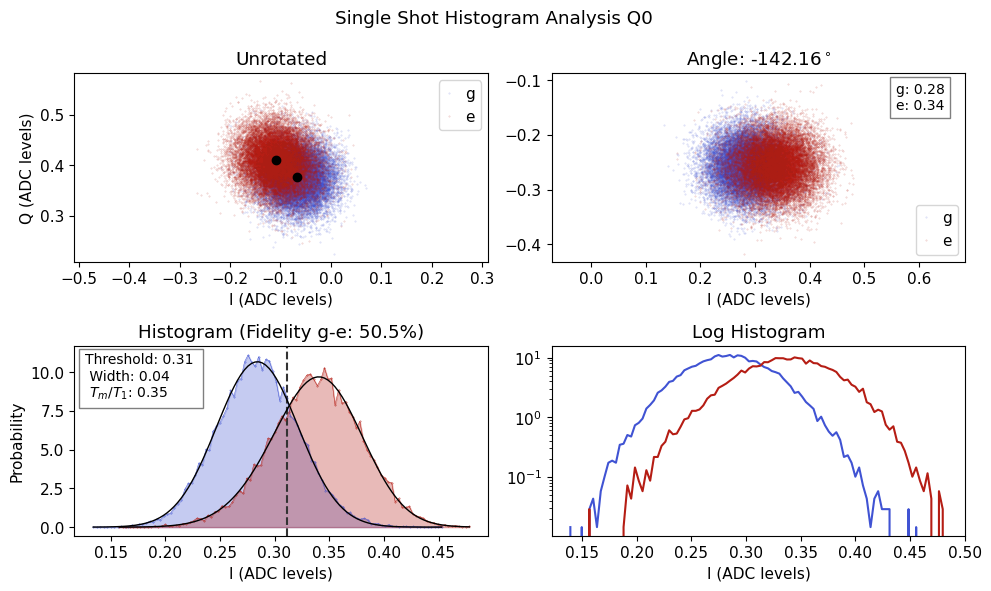

*Set cfg device.readout 0 phase to -142.1571 from 98.1192*
*Set cfg device.readout 0 threshold to 0.3114 from 0.2751*
*Set cfg device.readout 0 fidelity to 0.5052 from 0.3861*
*Set cfg device.readout 0 sigma to 0.0373 from 0.0362*
*Set cfg device.readout 0 tm to 0.3526 from 0.7834*
*Set cfg device.qubit 0 tuned_up to True from True*


  0%|          | 0/2 [00:00<?, ?it/s]

R2:0.900	Fit par error:0.030	 Best fit:b'avgi'


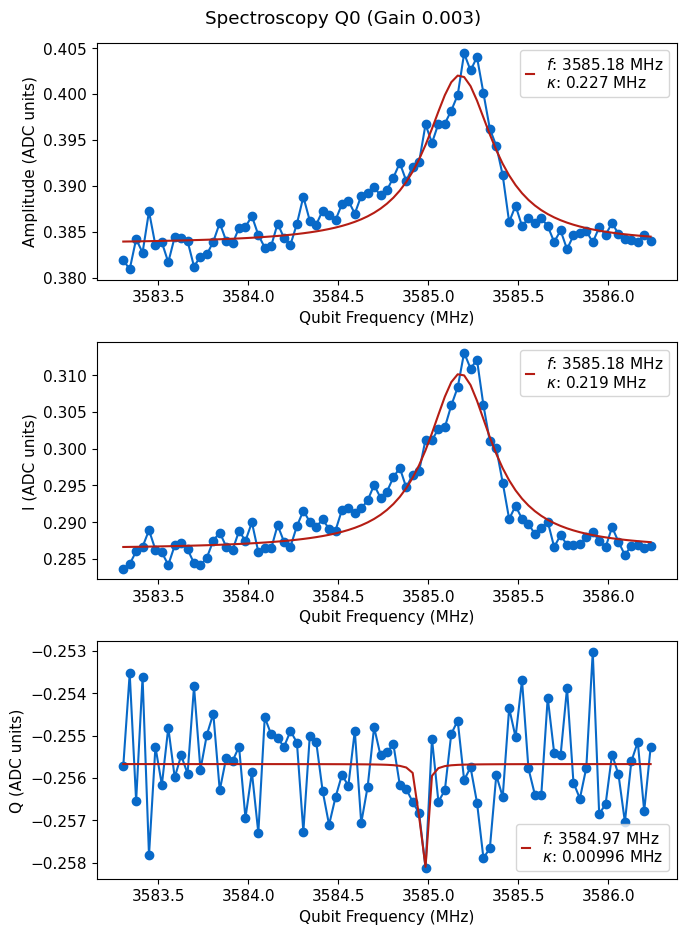

Qubit frequency is off spectroscopy by more than 250 kHz, recentering
*Set cfg device.qubit 0 f_ge to 3585.1772 from 3584.7707*


  0%|          | 0/15000 [00:00<?, ?it/s]

R2:0.977	Fit par error:0.013	 Best fit:b'avgi'


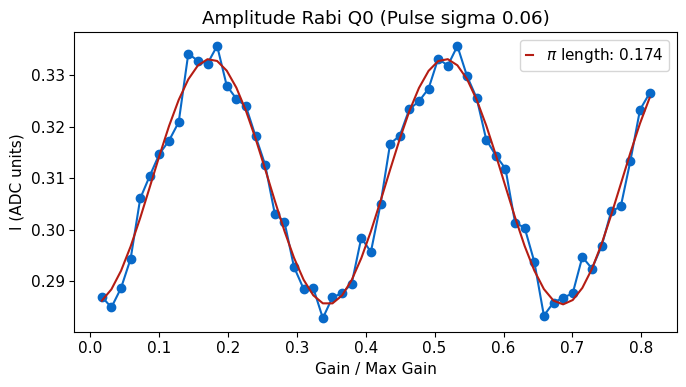

*Set cfg device.qubit 0 ('pulses', 'pi_ge', 'gain') to 0.1743 from 0.1653*
Try 0


  0%|          | 0/50000 [00:00<?, ?it/s]

R2:0.977	Fit par error:0.019	 Best fit:b'avgi'


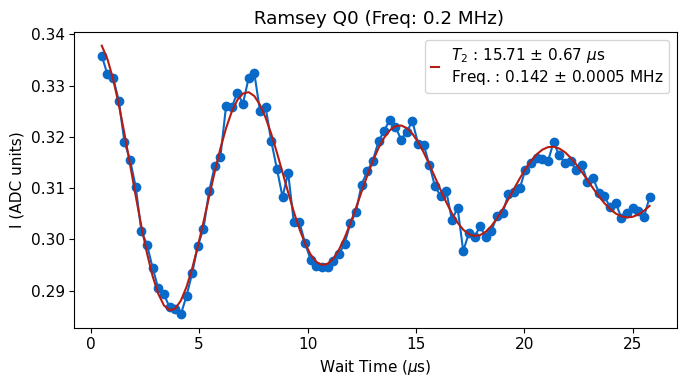

Scan successful. New frequency error is 0.058 MHz
*Set cfg device.qubit 0 f_ge to 3585.2348 from 3585.1772*
*Set cfg device.qubit 0 T2r to 15.708 from 8.62*
Try 1


  0%|          | 0/50000 [00:00<?, ?it/s]

R2:0.975	Fit par error:0.023	 Best fit:b'avgi'


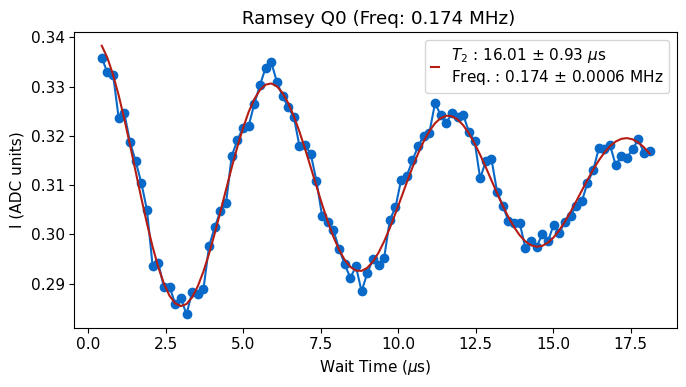

Scan successful. New frequency error is 0.000 MHz
*Set cfg device.qubit 0 f_ge to 3585.2348 from 3585.2348*
*Set cfg device.qubit 0 T2r to 16.0081 from 15.708*
Total Change in frequency: 0.058 MHz
[np.float64(0.05758057425970042), np.float64(3.186826366538553e-05)]
Qubit 0 recentered from 3585.1772 to 3585.2348


  0%|          | 0/15000 [00:00<?, ?it/s]

R2:0.978	Fit par error:0.009	 Best fit:b'avgi'


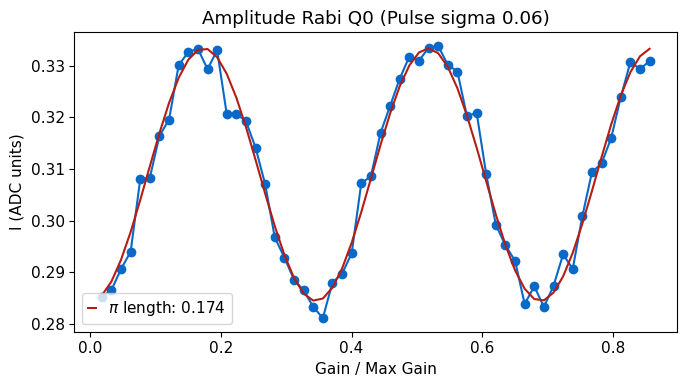

*Set cfg device.qubit 0 ('pulses', 'pi_ge', 'gain') to 0.1736 from 0.1743*


  0%|          | 0/20000 [00:00<?, ?it/s]

  0%|          | 0/20000 [00:00<?, ?it/s]

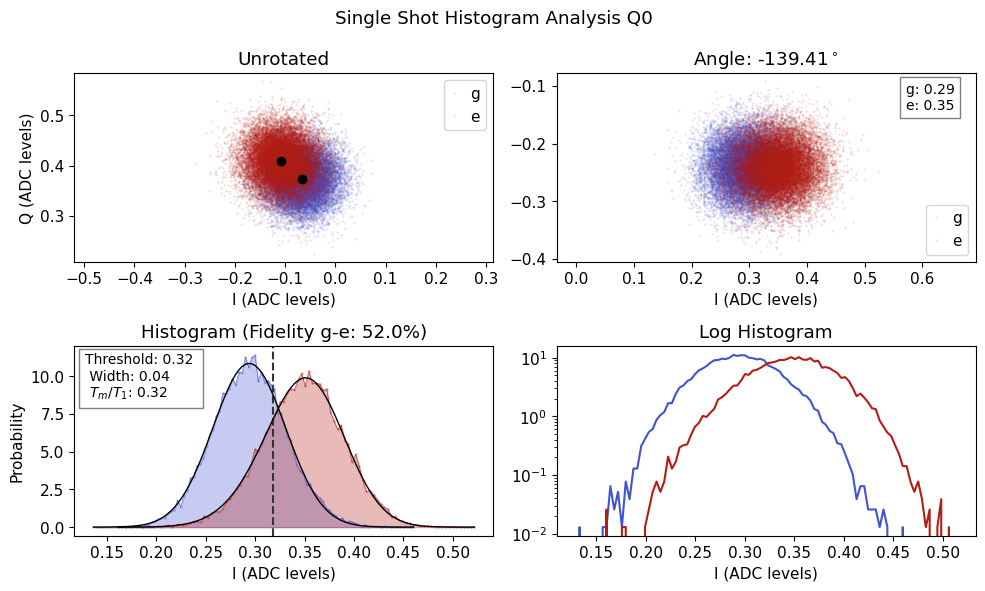

*Set cfg device.readout 0 phase to -139.4077 from -142.1571*
*Set cfg device.readout 0 threshold to 0.3178 from 0.3114*
*Set cfg device.readout 0 fidelity to 0.5202 from 0.5052*
*Set cfg device.readout 0 sigma to 0.0368 from 0.0373*
*Set cfg device.readout 0 tm to 0.3249 from 0.3526*
*Set cfg device.qubit 0 tuned_up to True from True*


  0%|          | 0/50000 [00:00<?, ?it/s]

R2:0.925	Fit par error:0.030	 Best fit:b'avgi'


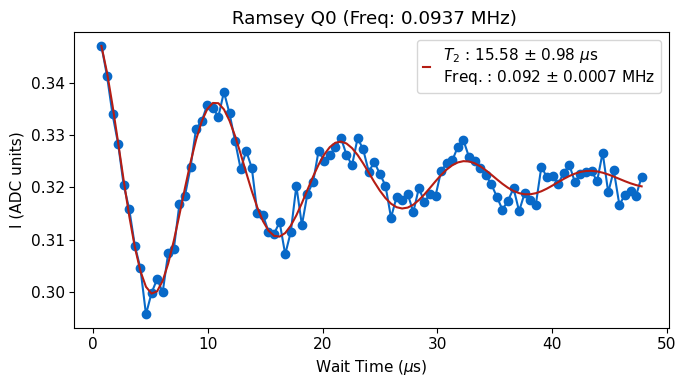

*Set cfg device.qubit 0 T2r to 15.58 from 16.0081*


  0%|          | 0/30000 [00:00<?, ?it/s]

R2:0.968	Fit par error:0.034	 Best fit:b'avgi'


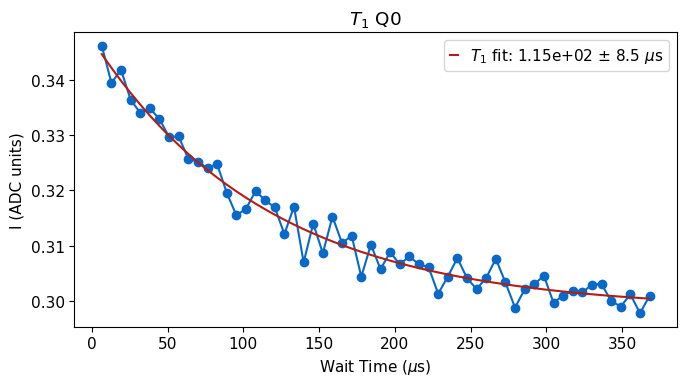

*Set cfg device.qubit 0 T1 to 115.45 from 101.19*
*Set cfg device.readout 0 final_delay to 692.69 from 607.15*


  0%|          | 0/50000 [00:00<?, ?it/s]

R2:0.939	Fit par error:0.027	 Best fit:b'avgi'


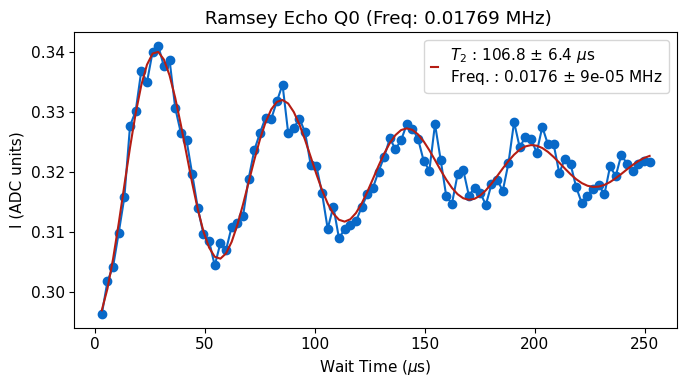

*Set cfg device.qubit 0 T2e to 106.83 from 84.77*


  0%|          | 0/5 [00:00<?, ?it/s]

Attempted to init fitparam 0 to 7140.259650421142, which is out of bounds 7140.259650421142 to 7147.19271697998. Instead init to 7143.726183700561


  0%|          | 0/2 [00:00<?, ?it/s]

Attempted to init fitparam 0 to 7140.259650421142, which is out of bounds 7140.259650421142 to 7147.19271697998. Instead init to 7143.726183700561


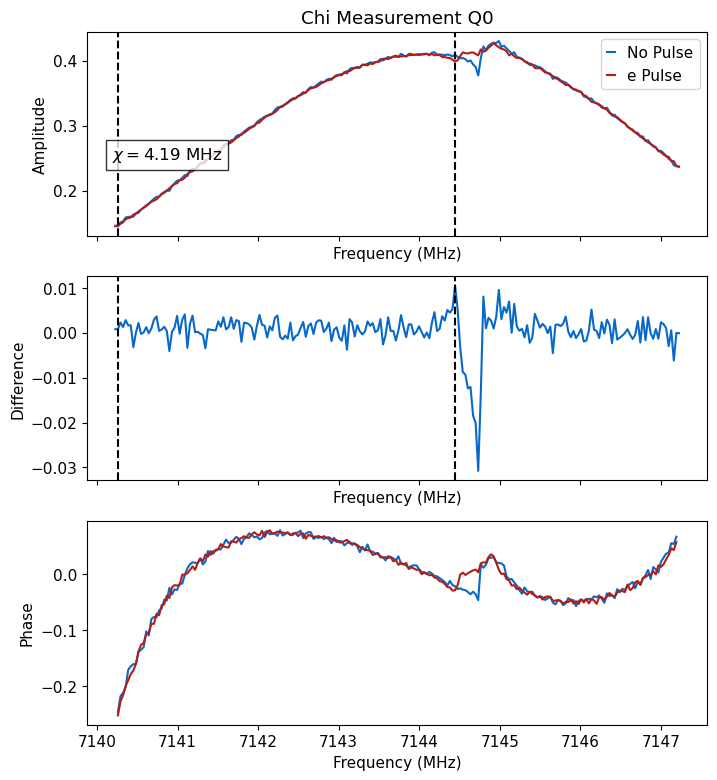

*Set cfg device.readout 0 chi to 4.1854 from 4.2173*


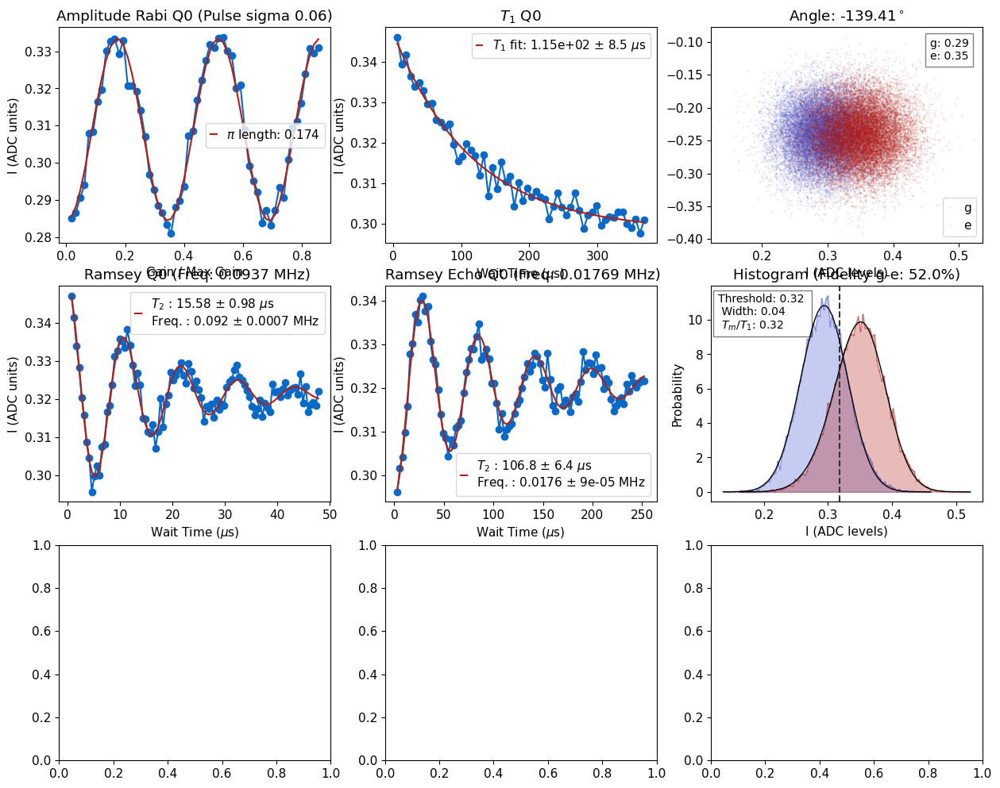

<Figure size 800x400 with 0 Axes>

C:\_Data\ll\images\summary\qubit0_measure_func_20250824_1347.png


In [29]:
qubit_list = np.arange(3)
qubit_list=[0]

#qubit_list=np.delete(qubit_list, [5,13])
# Worst issue with this right now is when the qubit frequency is not correct and readout is bad; gets stuck doing ramsey/spectroscopy forever. In this case, cancel it and go back to find qubits, try changing readout gain. 
plt.rcParams.update({'font.size': 11})
for qi in qubit_list: 
    qubit_tuning.tune_up_qubit(qi, cfg_dict, first_time=False, single=False, readout=True)

## Time tracking
fast = True only measures T2r and T1, otherwise does full set of scans.

In [ ]:
scan_length = 24 #  hours 

qubit_list = [0,1,2]
tt=time_tracking(qubit_list, cfg_dict,display=False,total_time=scan_length, fast=True)

## Rabi

### Amplitude

Uses gain/sigma set in pulses part of config

  0%|          | 0/15000 [00:00<?, ?it/s]

R2:0.960	Fit par error:0.012	 Best fit:b'avgi'


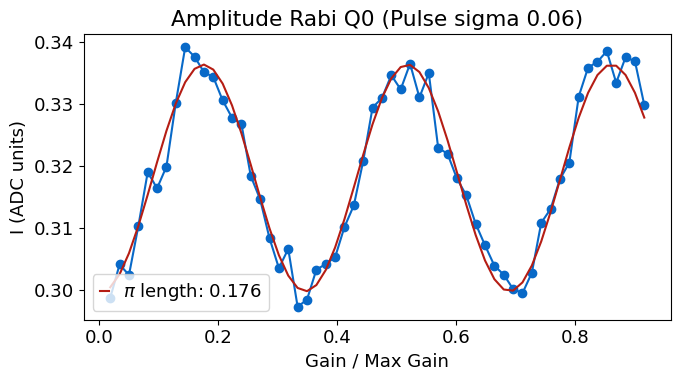

*Set cfg device.qubit 0 ('pulses', 'pi_ge', 'gain') to 0.1756 from 0.1867*


In [82]:
qubit_list = np.arange(3)
qubit_list=[0]

update=True

for qi in qubit_list: 
    #amp_rabi = meas.RabiExperiment(cfg_dict,qi=qi)
    
    # Fully customized version
    amp_rabi = meas.RabiExperiment(cfg_dict,qi=qi)

    if update and amp_rabi.status:
        config.update_qubit(cfg_path, ('pulses','pi_ge','gain'), amp_rabi.data['pi_length'], qi)
        

  0%|          | 0/9000 [00:00<?, ?it/s]

R2:0.938	Fit par error:0.228	 Best fit:b'avgi'


C:\_Lib\python\qq\slab_qick_calib\experiments\general\qick_experiment.py:809: OptimizeWarning: Covariance of the parameters could not be estimated
  popt, pcov = curve_fit(helpers.two_gaussians, bin_centers, hist, p0=p0)


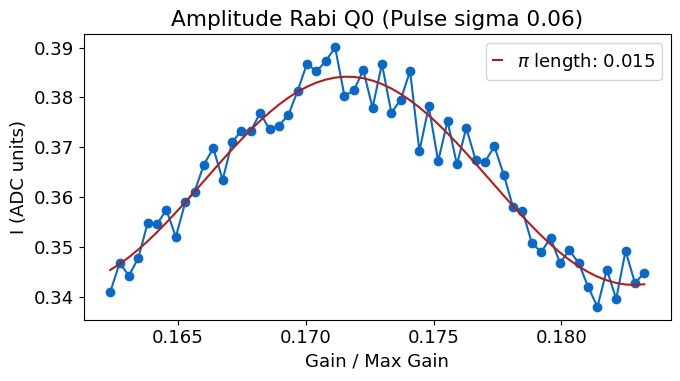

*Set cfg device.qubit 0 ('pulses', 'pi_ge', 'gain') to 0.1715 from 0.1736*


In [11]:
qi=0
amp_rabi = meas.RabiExperiment(cfg_dict,qi=qi, params={'n_pulses':15})
update=True
if update and amp_rabi.status:
    ind = np.argmax(amp_rabi.fitfunc(amp_rabi.data['xpts'], *amp_rabi.data['best_fit']))
    config.update_qubit(cfg_path, ('pulses','pi_ge','gain'), amp_rabi.data['xpts'][ind], qi);


#### Amp Chevron

In [130]:
d2=[]
qubit_list = np.arange(3)
qubit_list=[0]
for qi in qubit_list: 
    #amp_rabi_chevron = meas.RabiChevronExperiment(cfg_dict,qi=qi, params={'span_f':200,'sigma':0.25,'expts_f':100,'expts':100})

    amp_rabi_chevron = meas.RabiChevronExperiment(cfg_dict,qi=qi, params={'span_f':30, 'expts_f':20, 'checkEF':True}, live_plot=True)
    d2.append(amp_rabi_chevron)

#handy.plot_many(d2, title='Rabi Chevron Phase', save_path=cfg_dict['expt_path'], chan='phases')

Setting up a new session...


  0%|          | 0/20 [00:00<?, ?it/s]

C:\_Lib\python\qq\slab_qick_calib\experiments\general\qick_experiment.py:1352: UserWarning: Attempting to set identical low and high ylims makes transformation singular; automatically expanding.
  im1 = axs[0, 0].imshow(amps_so_far, **imshow_kwargs)
C:\_Lib\python\qq\slab_qick_calib\experiments\general\qick_experiment.py:1356: UserWarning: Attempting to set identical low and high ylims makes transformation singular; automatically expanding.
  im2 = axs[0, 1].imshow(phases_so_far, **imshow_kwargs)
C:\_Lib\python\qq\slab_qick_calib\experiments\general\qick_experiment.py:1360: UserWarning: Attempting to set identical low and high ylims makes transformation singular; automatically expanding.
  im3 = axs[1, 0].imshow(avgi_so_far, **imshow_kwargs)
C:\_Lib\python\qq\slab_qick_calib\experiments\general\qick_experiment.py:1364: UserWarning: Attempting to set identical low and high ylims makes transformation singular; automatically expanding.
  im4 = axs[1, 1].imshow(avgq_so_far, **imshow_kwargs

Chevron fit failed to converge.


TypeError: Object dtype dtype('O') has no native HDF5 equivalent

In [ ]:
handy.plot_many(d2, title='Rabi Chevron 7864', save_path=cfg_dict['expt_path'])

In [ ]:
amp_rabi_chevron.display(plot_both=True)

### Length -- Uses const pulses so do not use to set up pi pulses

Cannot do fast sweep with gaussian pulses due to multiplying qickparams issues; so need the "loop:True" for those, will make everything slower. 

  0%|          | 0/15000 [00:00<?, ?it/s]

C:\_Lib\python\qq\slab_qick_calib\experiments\general\qick_experiment.py:807: OptimizeWarning: Covariance of the parameters could not be estimated
  popt, pcov = curve_fit(helpers.two_gaussians, bin_centers, hist, p0=p0)


R2:0.886	Fit par error:0.029	 Best fit:b'avgq'


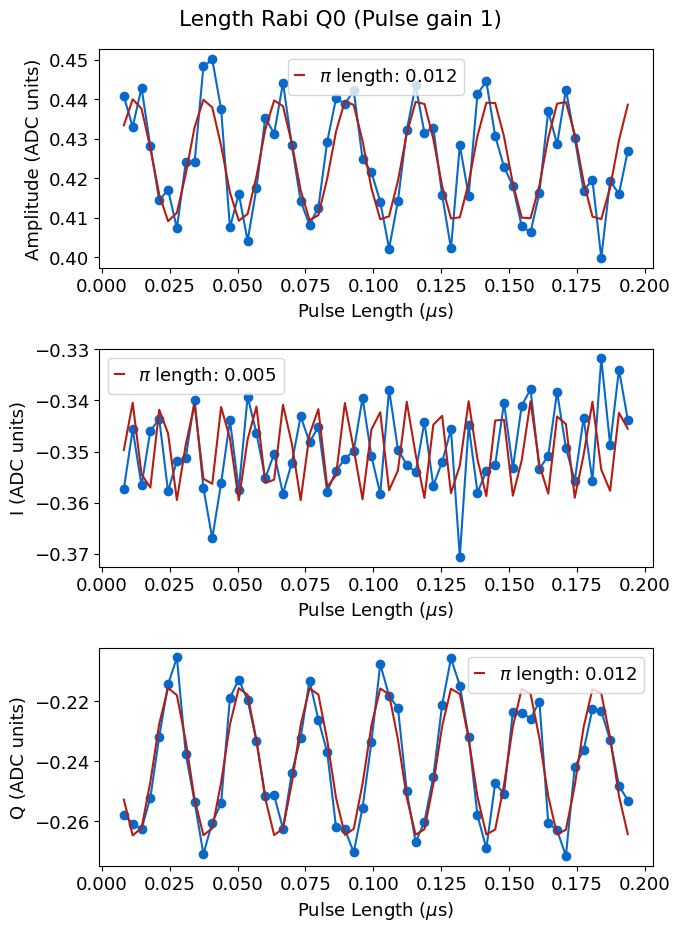

In [30]:
qubit_list = [0]
for qi in qubit_list: 
    # Needs to have params of sweep: length and type: cons
    #len_rabi = meas.RabiExperiment(cfg_dict,qi=qi, params={'sweep':'length', 'pulse_type':'gauss','loop':True})
    len_rabi = meas.RabiExperiment(cfg_dict,qi=qi, params={'sweep':'length', 'pulse_type':'const', 'max_length':0.2})

#### Length Chevron

  0%|          | 0/30 [00:00<?, ?it/s]

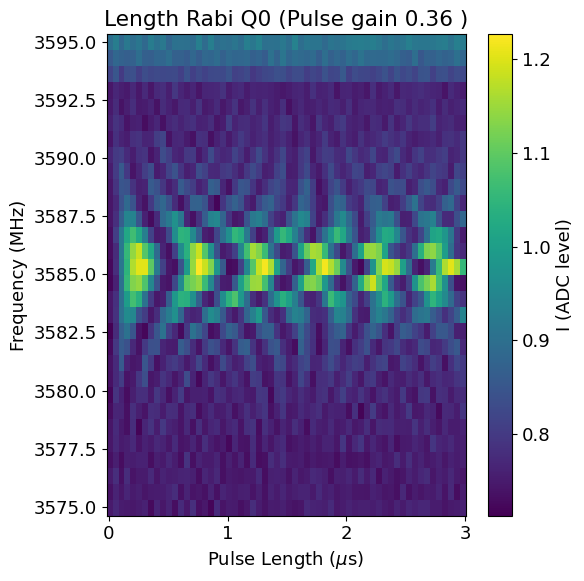

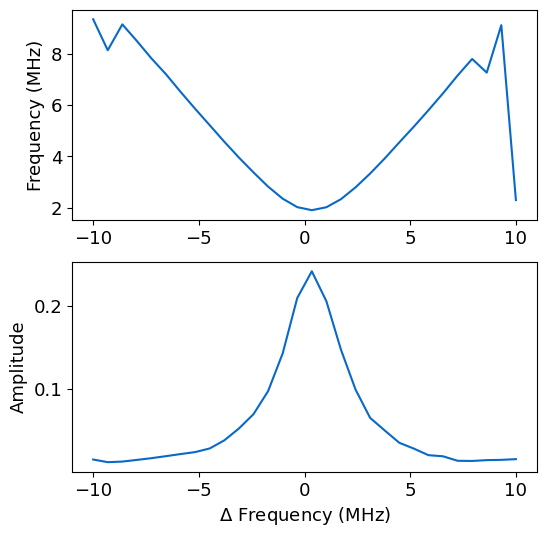

In [121]:
qubit_list = np.arange(3)
qubit_list=[0]
for qi in qubit_list: 
    len_rabi = meas.RabiChevronExperiment(cfg_dict,qi=qi, params={'sweep':'length',"type":"const", 'sigma':0.605, 'span_f':20})
    #len_rabi = meas.RabiChevronExperiment(cfg_dict,qi=qi, params={'sweep':'length',"type":"const", 'sigma':0.205, 'expts_f':60, 'span_f':150, 'gain':0.4,'start_f':6280,'rounds':4})

## Ramsey

  0%|          | 0/50000 [00:00<?, ?it/s]

R2:0.946	Fit par error:0.025	 Best fit:b'avgi'


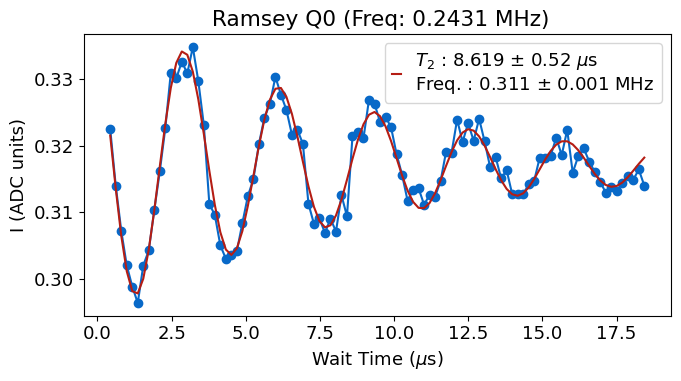

*Set cfg device.qubit 0 f_ge to 3584.7707 from 3584.839*
*Set cfg device.qubit 0 T2r to 8.62 from 6.17*


In [80]:
qubit_list=[0]
update = True

for qi in qubit_list:
    t2r = meas.T2Experiment(cfg_dict, qi=qi, max_err=10)

    # Manually configured
    #t2r = meas.T2Experiment(cfg_dict, qi=qi, max_err=10, params = {'ramsey_freq':1,'expts':100, 'span':10,'start':0.01})
    if t2r.status and update:
        config.update_qubit(cfg_path, 'f_ge', t2r.data['new_freq'], qi)
        auto_cfg = config.update_qubit(cfg_path, 'T2r', t2r.data['best_fit'][3], qi, rng_vals=[1.5, max_t1], sig=2)
    else:
        print('T2 Ramsey fit failed')

### Use Ramsey to recenter

In [ ]:
qubit_list = [2]
for qi in qubit_list:
    status = qubit_tuning.recenter(qi,cfg_dict)            

### Ramsey coherence

In [ ]:
t1= qubit_tuning.get_coherence(meas.RamseyExperiment, qi, cfg_dict,par='T2r')

## T1

If it's the first time, also set T2r and T2e as guesses 


  0%|          | 0/18000 [00:00<?, ?it/s]

R2:0.976	Fit par error:0.026	 Best fit:b'avgi'


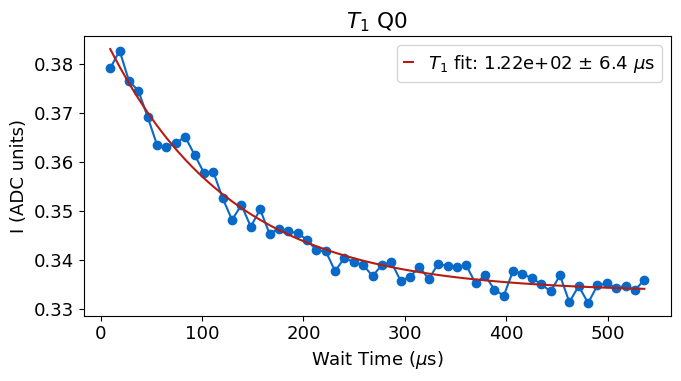

*Set cfg device.qubit 0 T1 to 121.79 from 147.3*
*Set cfg device.readout 0 final_delay to 730.73 from 883.78*


In [20]:
update=True
first_time=False

qubit_list = np.arange(3)
qubit_list=[0]
for qi in qubit_list:
    t1 = meas.T1Experiment(cfg_dict, qi=qi)
    #t1 = meas.T1Experiment(cfg_dict, qi=qi, params={'reps':1000,'span':0, 'start':20})

    if update: t1.update(first_time=first_time)

### T1 coherence

Runs scan until scan is properly configured to be sensitive to T1

In [ ]:
qi=0
qubit_tuning.get_coherence(meas.T1Experiment,qi=qi,cfg_dict=cfg_dict,par='T1')

### Continuous scan at single point
Times do not seem to be accurate right now 

  0%|          | 0/20000 [00:00<?, ?it/s]

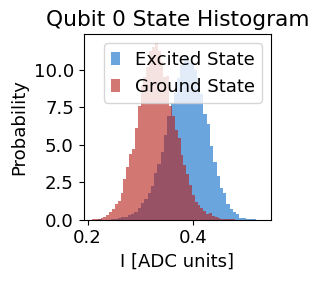

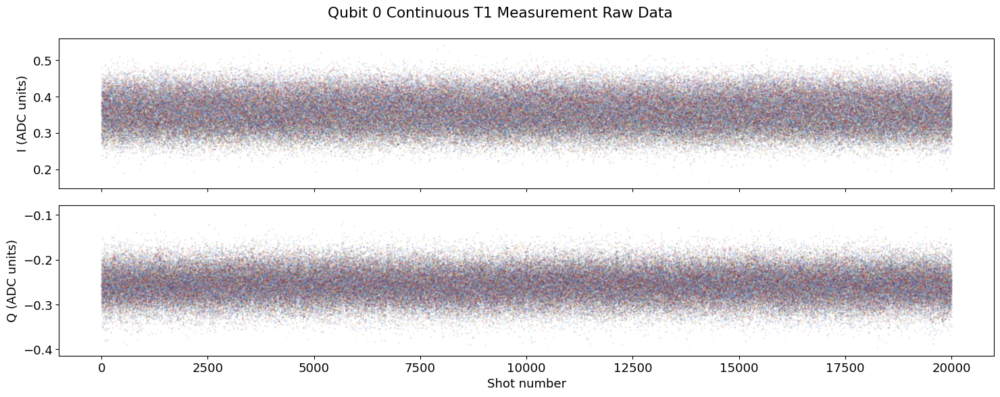

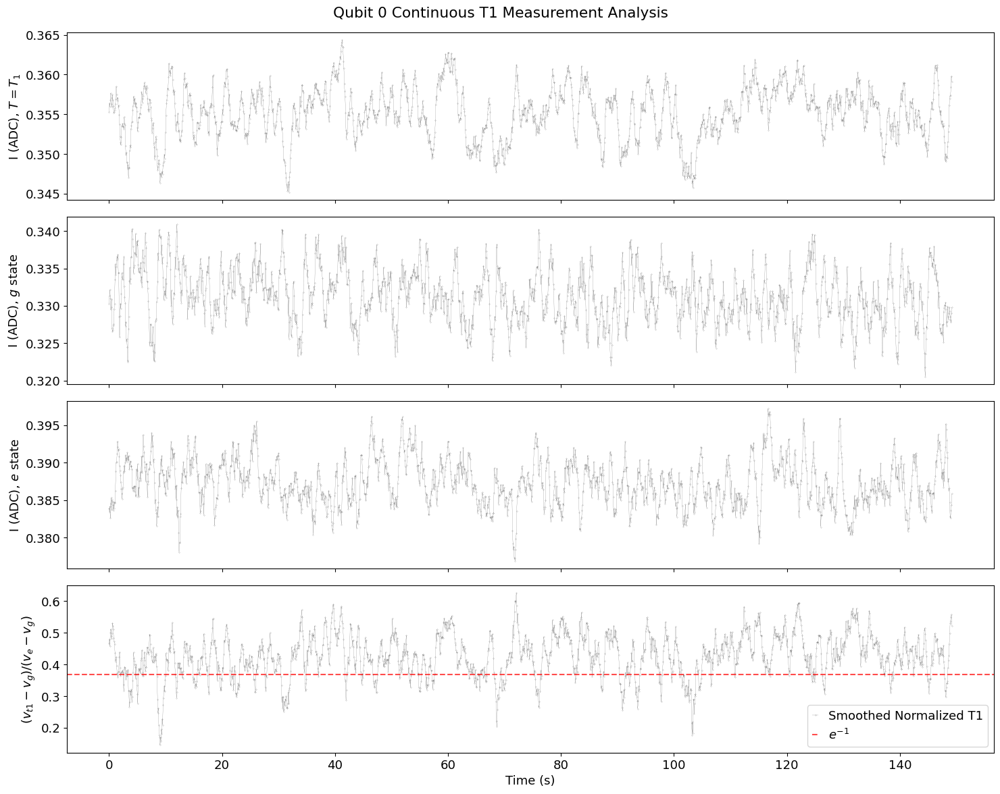

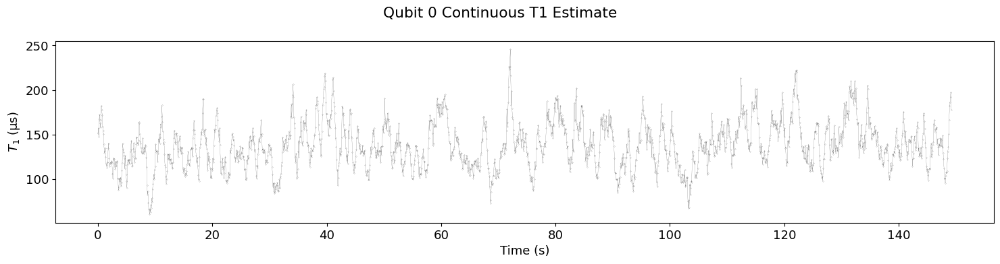

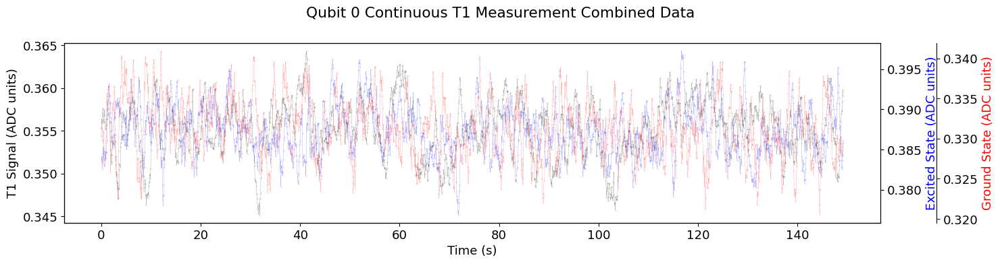

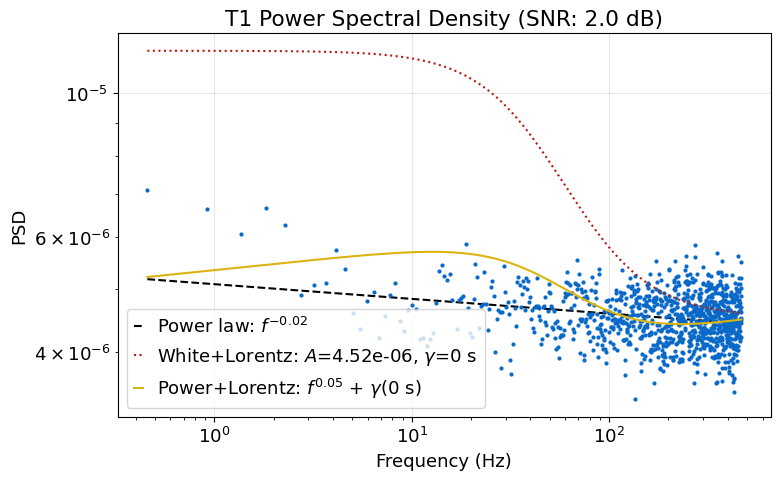

In [14]:
qi=0
t1cont = meas.T1ContExperiment(cfg_dict,qi=qi, params={'shots':20000})

### T1 continuous 2Q

In [ ]:
qi = [10,0]
meas.T1_2Q(cfg_dict,qi=qi, )

In [ ]:
qi=[0,10]
scan_time = 0.1 #hours
number_of_scans = 1
shots = int(100000*scan_time*60/4)
print(shots)
for i in range(number_of_scans):
    meas.T1Cont2QExperiment(cfg_dict,qi=qi, params={'shots':shots, 'active_reset':False})

## Echo and more

  0%|          | 0/50000 [00:00<?, ?it/s]

R2:0.904	Fit par error:0.034	 Best fit:b'avgi'


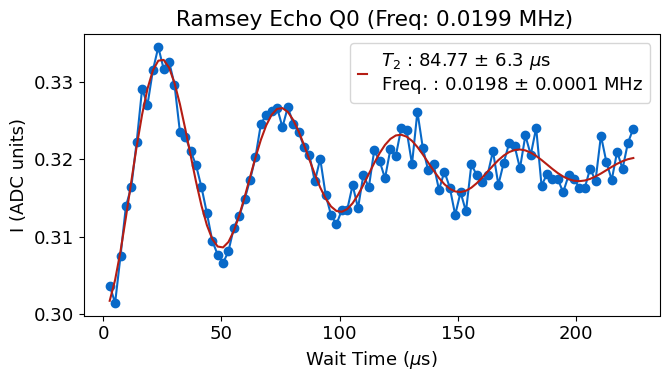

*Set cfg device.qubit 0 T2e to 84.77 from 75.39*


In [92]:
qubit_list = np.arange(3)
qubit_list=[0]
update=True
for qi in qubit_list:
    # Need to have experiment type set to echo
    t2e = meas.T2Experiment(cfg_dict, qi=qi, params={'experiment_type':'echo'})
    if t2e.status and update:
        auto_cfg = config.update_qubit(cfg_path, 'T2e', t2e.data['best_fit'][3], qi,sig=2, rng_vals=[1.5, max_t1*2])

### More pi / CPMG
Breaks above 12 right now; need to make it a python loop 

In [94]:
qubit_list = np.arange(3)
qubit_list=[1]
update=True
nums_pi = [10]
for qi in qubit_list:
    for pi in nums_pi:
        # Need to have experiment type set to echo
        t2e = meas.T2Experiment(cfg_dict, qi=qi, params={'experiment_type':'cpmg','num_pi':pi})


  0%|          | 0/50000 [00:00<?, ?it/s]

KeyboardInterrupt: 

### Get echo coherence

In [ ]:
qi=6
t2e = qubit_tuning.get_coherence(meas.RamseyEchoExperiment, qi, cfg_dict,'T2e')

## Feedback checks

In [ ]:
qi=10
reset = meas.MemoryExperiment(cfg_dict, qi=qi, params={'shots':1, 'expts':200})

In [ ]:
# Don't do the active reset, just do the repeated measurement 
qi=1
shot = meas.RepMeasExperiment(cfg_dict, qi=qi, params={'shots':30000,'active_reset':True, 'setup_reset':True})
shot.check_reset()

# Single Shot

  0%|          | 0/10000 [00:00<?, ?it/s]

  0%|          | 0/10000 [00:00<?, ?it/s]

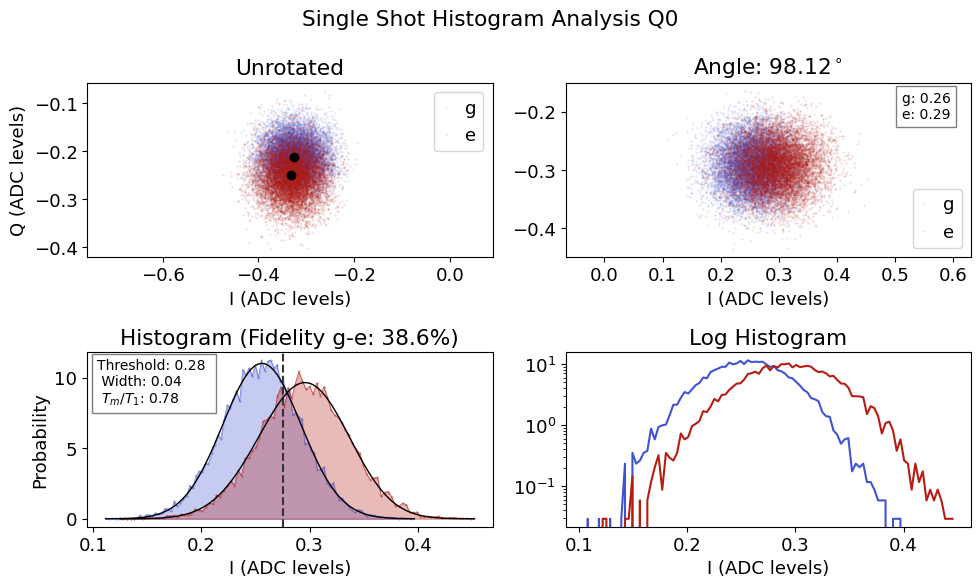

*Set cfg device.readout 0 phase to 98.1192 from 107.2968*
*Set cfg device.readout 0 threshold to 0.2751 from 0.3212*
*Set cfg device.readout 0 fidelity to 0.3861 from 0.3146*
*Set cfg device.readout 0 sigma to 0.0362 from 0.0359*
*Set cfg device.readout 0 tm to 0.7834 from 1.7227*
*Set cfg device.qubit 0 tuned_up to True from True*


In [98]:
# Single shot 
qubit_list = np.arange(3)
qubit_list =[0]

for qi in qubit_list:
    shot=meas.HistogramExperiment(cfg_dict, qi=qi)

    # Configure number of shots
    #shot=meas.HistogramExperiment(cfg_dict, qi=qi, params={'shots':300000})
    shot.update(cfg_path)

### Adjust reps for fidelity 

In [ ]:
max_inc = 15 # dont' let it do more than 15x standard number of reps so that things don't take forever
qubit_list = [0]

auto_cfg = config.load(cfg_path)
for qi in qubit_list:
    config.update_readout(cfg_path, 'reps', 1/auto_cfg['device']['readout']['fidelity'][qi]**1.5, qi, rng_vals=[1,max_inc]);

## Readout opt

### General sweep

Runs single shot experiments for many readout lengths, frequencies, gains and compares fidelity

low_gain=True chooses lowest gain/readout length within a few percent of maximum gain (often readout fidelity fairly flat as a function of gain at higher gain values) 

style='fine' varies parameters by 20%, style='' varies by 2x

Unexpected parameters found in params: {'step_f', 'step_gain', 'step_len'}


  0%|          | 0/5 [00:00<?, ?it/s]

Max fidelity 55.588 %
Optimal params: 
 Freq (MHz) 7144.728 
 Gain (DAC units) 0.285 
 Readout length (us) 41.675
Fidelity is not maximized at the center of the sweep.
Max fidelity found at indices: (np.int64(0), np.int64(3), np.int64(4))


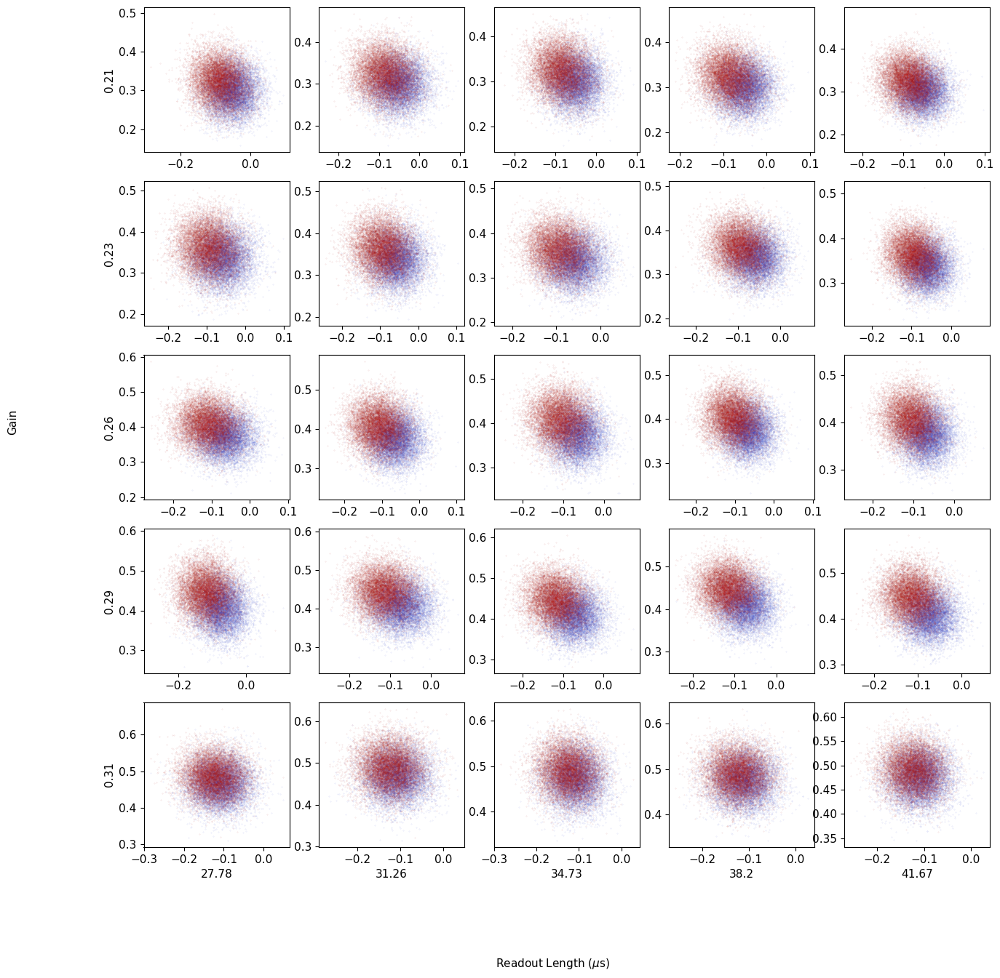

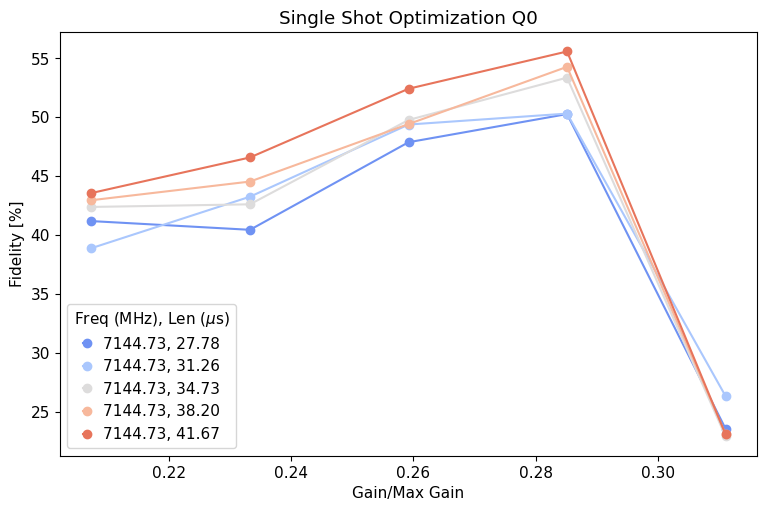

Max fidelity 55.588 %
Optimal params: 
 Freq (MHz) 7144.728 
 Gain (DAC units) 0.285 
 Readout length (us) 41.675
Fidelity is not maximized at the center of the sweep.
Max fidelity found at indices: (np.int64(0), np.int64(3), np.int64(4))
*Set cfg device.readout 0 gain to 0.2851 from 0.2592*
*Set cfg device.readout 0 readout_length to 41.6746 from 34.7288*
*Set cfg device.readout 0 frequency to 7144.7277 from 7144.7277*


  0%|          | 0/10000 [00:00<?, ?it/s]

  0%|          | 0/10000 [00:00<?, ?it/s]

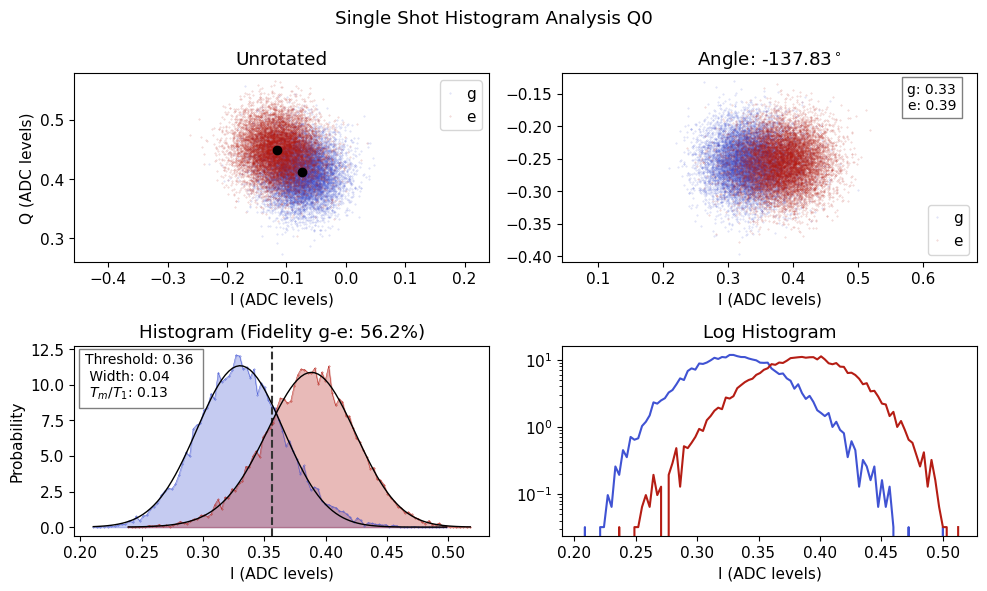

*Set cfg device.readout 0 phase to -137.8341 from -139.4077*
*Set cfg device.readout 0 threshold to 0.3559 from 0.3178*
*Set cfg device.readout 0 fidelity to 0.5617 from 0.5202*
*Set cfg device.readout 0 sigma to 0.0352 from 0.0368*
*Set cfg device.readout 0 tm to 0.1348 from 0.3249*
*Set cfg device.qubit 0 tuned_up to True from True*


In [30]:
update=True
low_gain=True

qubit_list=np.arange(3)
qubit_list=[0]

params = {'expts_f':1, 'expts_gain':5, 'expts_len':5,'shots':10000}
#params = {'expts_f':10, 'expts_gain':1, 'expts_len':1}

# Specify exact ranges to use  
#params = {'expts_f':1, 'expts_gain':9, 'expts_len':9,'start_gain':0.45, 'span_gain':0.05,'start_len':2, 'span_len':5}

for qi in qubit_list: 
    shotopt=meas.SingleShotOptExperiment(cfg_dict, qi=qi,params=params, style='fine')
    shotopt.analyze(low_gain=low_gain)
    if update: shotopt.update(cfg_dict['cfg_file'])

    shot=meas.HistogramExperiment(cfg_dict, qi=qi)
    shot.update(cfg_path)

### Run optimization until it converges

In [ ]:
qubit_list=np.arange(3)
qubit_list=[19]
params = {'expts_f':1, 'expts_gain':7, 'expts_len':7}

# do_res also runs res spec and resets readout frequency that way each round. 
qubit_tuning.meas_opt(cfg_dict, qubit_list, params, do_res=True)

### Vary trig_offset to see if it changes fidelity. 

In [ ]:
# Single shot 
qubit_list = np.arange(3)
qubit_list =[11]
trig_list = np.linspace(0.2,1,12)
fids =[]
for qi in qubit_list:
    for trig in trig_list: 
        config.update_readout(cfg_path, 'trig_offset', trig, qi);
        shot=meas.HistogramExperiment(cfg_dict, qi=qi, params={'shots':20000, 'trigger':trig})
        fids.append(shot.data['fids'][0])
    

### Play with LO freq (when using qick for LO)

In [ ]:
auto_cfg = config.load(cfg_path)
start_freq = auto_cfg.device.readout.frequency[qi]
start_mixer = auto_cfg.hw.soc.lo.mixer_freq[qi]
rng = np.linspace(-1000,1000,11)
fids=[]
for qi in qubit_list: 
    for r in rng: 
        config.update_lo(cfg_path, 'mixer_freq', start_mixer+r, qi)
        config.update_readout(cfg_path, 'frequency', start_freq-r, qi)
        shot=meas.HistogramExperiment(cfg_dict, qi=qi, params={'shots':20000})
        fids.append(shot.data['fids'][0])

config.update_lo(cfg_path, 'mixer_freq', start_mixer, qi)
config.update_readout(cfg_path, 'frequency', start_freq, qi)

#### Play with LO power

In [ ]:
qi = 0
gain_vals = [0.0375,0.05] 
fids = []
for gain in gain_vals:
    config.update_lo(cfg_path, 'gain', gain, qi)
    shotopt=meas.SingleShotOptExperiment(cfg_dict, qi=qi,params={'npts_f':5, 'npts_gain':5, 'npts_len':5})
    fids.append(shot.data['fids'][0])

## Active reset

### Check active reset at standard threshold

Setup reset uses the calibrated angle and runs active reset process at end, but also uses usual final_delay so that it's ok if reset not working

In [ ]:
qubit_list = np.arange(3)
qubit_list=[0,1,2]
d=[]
for qi in qubit_list:
    shot = meas.HistogramExperiment(cfg_dict, qi=qi, params={'shots':30000,'active_reset':True, 'setup_reset':True})
    shot.check_reset()
    #config.update_readout(cfg_path, 'reset_e', shot.data['reset_e'], qi)
    #config.update_readout(cfg_path, 'reset_g', shot.data['reset_g'], qi)
    d.append(shot)

### Sweep threshold

In [ ]:
d = []
qi=10
auto_cfg = config.load(cfg_path)
threshold = auto_cfg['device']['readout']['threshold'][qi]
thresh = np.linspace(threshold-25,threshold+25,16)
#thresh = np.linspace(threshold-10,threshold+10,6)
for t in thresh:
    shot=meas.HistogramExperiment(cfg_dict, qi=qi, params={'shots':100000,'threshold_v':t, 'active_reset':True,'setup_reset':True}, display=False, progress=False)
    d.append(shot)
    #shot.check_reset()
measure_func.plot_reset(d)

### Turn off active reset for all config chans

In [ ]:
for qi in range(20):
    config.update_readout(cfg_path, 'active_reset',False, qi)

### Turn on active reset for channels where it seems to be working

In [ ]:
e_success = 0.15 # Ratio of e proportion after active reset compared to before
g_vs_e = 2 # Ratio of g proportion to e proportion after active reset

auto_cfg = config.load(cfg_path)
reset_e = auto_cfg['device']['readout']['reset_e']
reset_g = auto_cfg['device']['readout']['reset_g']
result = np.array(reset_e)< e_success | np.array(reset_g)/np.array(reset_e)<g_vs_e
for qi in range(20):
    config.update_readout(cfg_path, 'active_reset',bool(result[qi]), qi)

### Check reset (plotting result of reset)

In [ ]:
qubit_list = np.arange(3)
qubit_list =[17]
for qi in qubit_list:
    shot = meas.HistogramExperiment(cfg_dict, qi=qi, params={'shots':50000,'active_reset':True})
    shot.check_reset()

# Chi

  0%|          | 0/5 [00:00<?, ?it/s]

Attempted to init fitparam 0 to 7140.221356201172, which is out of bounds 7140.221356201172 to 7147.15442276001. Instead init to 7143.6878894805905


  0%|          | 0/2 [00:00<?, ?it/s]

Attempted to init fitparam 0 to 7140.221356201172, which is out of bounds 7140.221356201172 to 7147.15442276001. Instead init to 7143.6878894805905


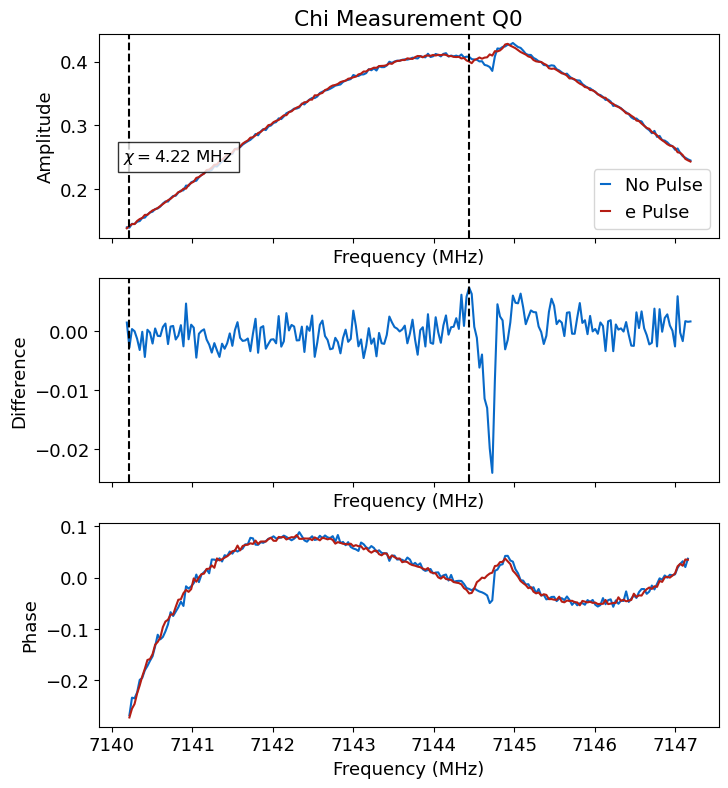

*Set cfg device.readout 0 chi to 4.2173 from 0*


In [95]:
# Need a tuned up pi pulse for this

qubit_list = [0]
for qi in qubit_list: 
    chi, chi_val=measure_func.check_chi(cfg_dict, qi)
    auto_cfg = config.update_readout(cfg_path, 'chi', chi_val, qi)

# 2 Qubit

In [ ]:
t12q = meas.T1_2Q(cfg_dict, qi=[10,0], params={'active_reset':False, })

In [ ]:
rabi2q = meas.Rabi_2Q(cfg_dict, qi=[10,0], params={'active_reset':True})

# EF 

### Initial setting of frequencies based on guess for alpha

In [105]:
# Initial set of the frequencyies based on guess for alpha 
alpha = -200
#qubit_list = np.arange(3)
qubit_list = [0,1]
auto_cfg = config.load(cfg_path)
for i in qubit_list: 
    f_ge = auto_cfg['device']['qubit']['f_ge'][i]
    auto_cfg = config.update_qubit(cfg_path, 'f_ef', f_ge+alpha, i)

*Set cfg device.qubit 0 f_ef to 3384.7707 from 3800*
*Set cfg device.qubit 1 f_ef to 3800 from 3800*


## Spectroscopy EF

### General search

In [ ]:
qubit_list= np.arange(3)
bad_qubits=[]
qubit_list=[0,1,2]
for qi in qubit_list:
    status, ntries = qubit_tuning.find_spec(qi, cfg_dict, start='medium', freq='ef')
    if not status:
        bad_qubits.append(qi)

### Specific width

  0%|          | 0/150000 [00:00<?, ?it/s]

C:\_Lib\python\qq\slab_qick_calib\experiments\general\qick_experiment.py:807: OptimizeWarning: Covariance of the parameters could not be estimated
  popt, pcov = curve_fit(helpers.two_gaussians, bin_centers, hist, p0=p0)


R2:0.793	Fit par error:0.029	 Best fit:b'avgi'


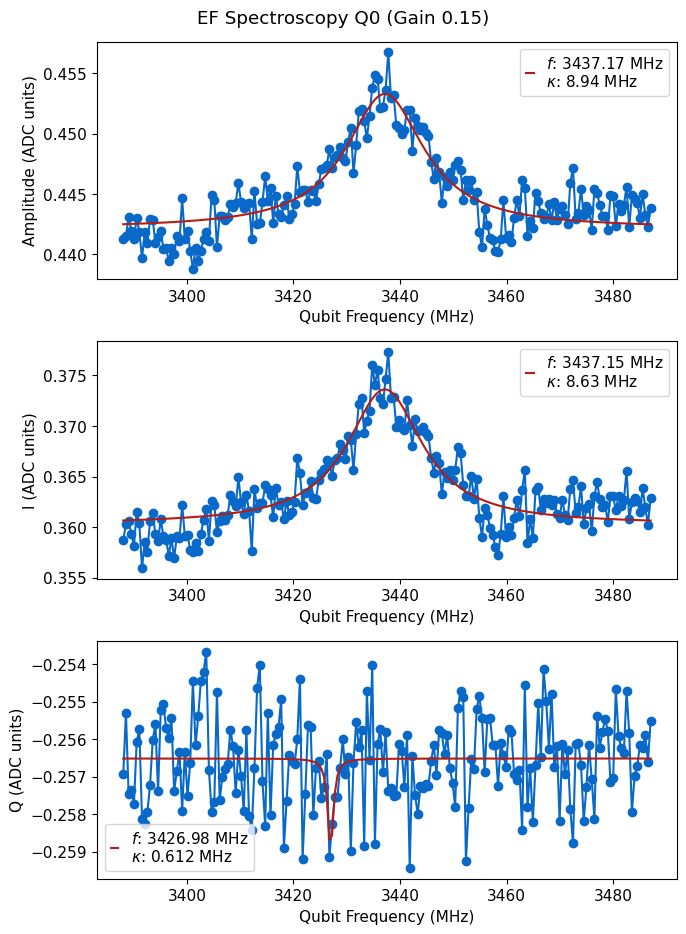

*Set cfg device.qubit 0 f_ef to 3437.1538 from 3437.5539*


In [32]:
# You may want to update this frequency, which will be the center of the scan. 
#style huge, coarse, medium, fine 
update=True

qubit_list = np.arange(3)
qubit_list=[0]
for qi in qubit_list:
    #qspec=meas.QubitSpec(cfg_dict, qi=qi, style='medium', params={'checkEF':True, 'reps':500,'gain':0.2})
    qspec=meas.QubitSpec(cfg_dict, qi=qi, style='medium', params={'checkEF':True, 'reps':750,'gain':0.15, 'span':100})

    #qspec=meas.QubitSpec(cfg_dict, qi=qi, style='medium', params={'checkEF':True})#, params={'span':500, 'expts':1000,'reps':500,'gain':0.2})
    if update and qspec.status:
        auto_cfg = config.update_qubit(cfg_path, 'f_ef', qspec.data["best_fit"][2], qi)

## Rabi EF

*Set cfg device.qubit 0 ('pulses', 'pi_ef', 'sigma') to 0.06 from 1.36*
*Set cfg device.qubit 0 ('pulses', 'pi_ef', 'gain') to 0.1736 from 0.0778*


  0%|          | 0/24000 [00:00<?, ?it/s]

R2:0.982	Fit par error:0.012	 Best fit:b'avgi'


C:\_Lib\python\qq\slab_qick_calib\experiments\general\qick_experiment.py:807: OptimizeWarning: Covariance of the parameters could not be estimated
  popt, pcov = curve_fit(helpers.two_gaussians, bin_centers, hist, p0=p0)


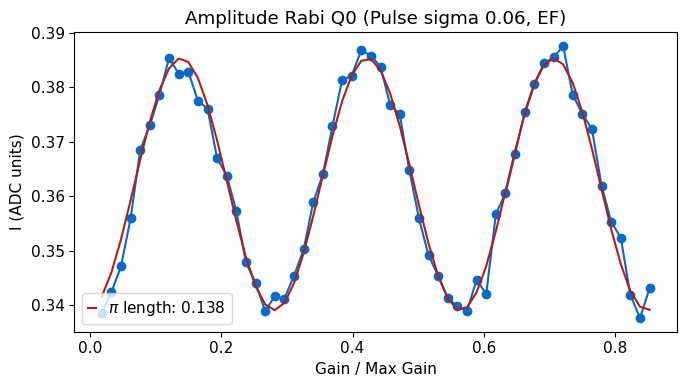

*Set cfg device.qubit 0 ('pulses', 'pi_ef', 'gain') to 0.1384 from 0.1736*


In [33]:
# If first time, initialize the sigma and gain to those of the ge 
first_time = True
update = True

qubit_list = np.arange(3)
qubit_list=[0]

bad_qubits = []
auto_cfg = config.load(cfg_path)

for qi in qubit_list: 
    if first_time:
        #config.update_qubit(cfg_path, 'f_ef', auto_cfg.device.qubit.f_spec_ef[qi], qi)
        auto_cfg = config.update_qubit(cfg_path, ('pulses','pi_ef','sigma'), auto_cfg['device']['qubit']['pulses']['pi_ge']['sigma'][qi], qi)
        auto_cfg = config.update_qubit(cfg_path, ('pulses','pi_ef','gain'), auto_cfg['device']['qubit']['pulses']['pi_ge']['gain'][qi], qi)
    amp_rabi = meas.RabiExperiment(cfg_dict,qi=qi, params={'checkEF':True, 'reps':400})
    if update and amp_rabi.status:
        config.update_qubit(cfg_path, ('pulses','pi_ef','gain'), amp_rabi.data['pi_length'], qi)
    else:
        print(f'Amplitude Rabi fit failed for qubit {qi}')
        bad_qubits.append(qi)

    # MAX GAIN IS GOING TO 5 

## Qubit Temperature

  0%|          | 0/15000 [00:00<?, ?it/s]

R2:0.975	Fit par error:0.014	 Best fit:b'avgi'


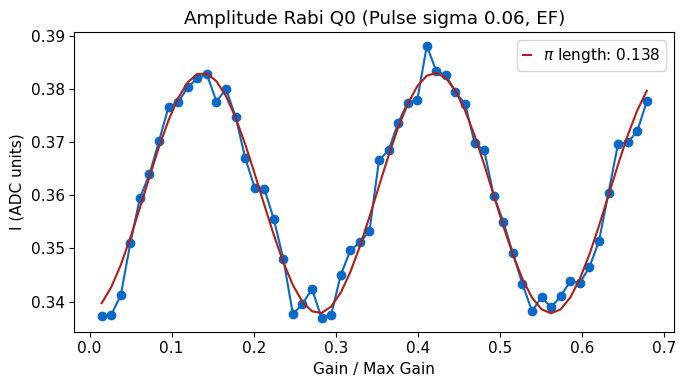

  0%|          | 0/200000 [00:00<?, ?it/s]

R2:0.356	Fit par error:0.166	 Best fit:b'avgi'


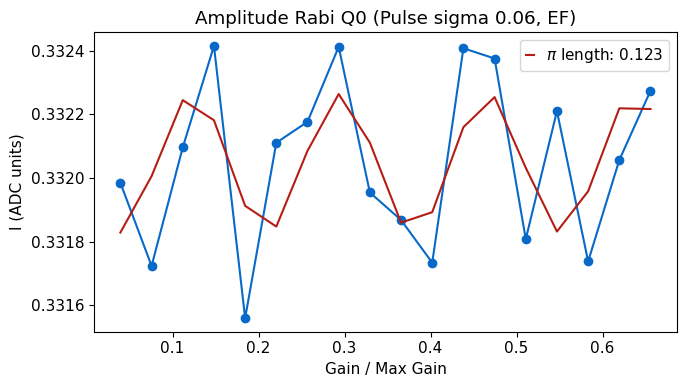

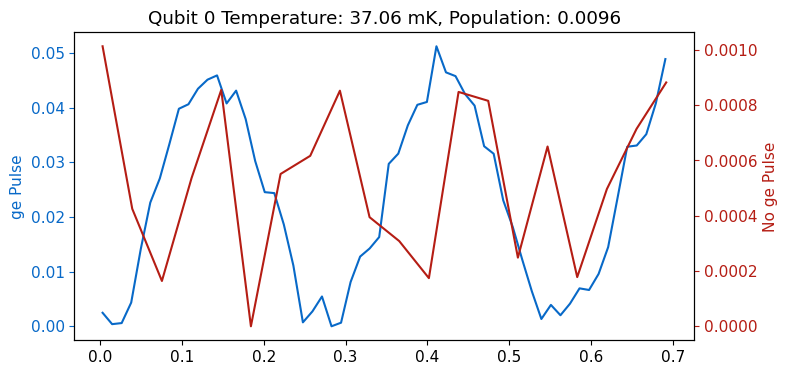

*Set cfg device.qubit 0 temp to 37.0571 from 0*
*Set cfg device.qubit 0 pop to 0.0096 from 0*


In [34]:
qubit_list = np.arange(3)
qubit_list=[0]
# Setting number of rounds multiplies the default number of rounds by that number, so can be greater than or less than 1. 

for qi in qubit_list: 
    # rounds will make scan take longer, needed for lower temperatures. 
    temp, pop = measure_func.measure_temp(cfg_dict, qi=qi)# , rounds=5)
    auto_cfg = config.update_qubit(cfg_path, 'temp', temp, qi)
    auto_cfg = config.update_qubit(cfg_path, 'pop', pop, qi)

## Calculate Ec and Ej

In [ ]:
auto_cfg = config.load(cfg_path)
import scqubits as scq
for i in np.arange(3):
    alpha =  auto_cfg.device.qubit.f_ef[i] - auto_cfg.device.qubit.f_ge[i]
    en = scq.Transmon.find_EJ_EC(auto_cfg.device.qubit.f_ge[i]/1000,alpha/1000)
    print(alpha)
    print(en)
    q = np.pi*2 * auto_cfg.device.qubit.f_ge[i] * auto_cfg.device.qubit.T1[i]
    print(q)

## Ramsey EF

In [ ]:
update=True
qubit_list=np.arange(3)
#qubit_list=[12]

for qi in qubit_list:
    t2r = meas.T2Experiment(cfg_dict, qi=qi, params={'ramsey_freq':0.15, 'checkEF':True})

    if update and t2r.status:
        config.update_qubit(cfg_path, 'f_ef', t2r.data['new_freq'], qi)
    else:
        print('T2 Ramsey fit failed')

# Calculate qubit params

In [41]:
from slab_qick_calib.analysis import qubit_params 

config.init_model_config(cfg_dict['cfg_file'], 6)
qubit_params.ham(cfg_path)
qubit_params.delta(cfg_path)
qubit_params.cohere(cfg_path)

 C:\_Lib\python\qq\slab_qick_calib\analysis\qubit_params.py: 11

TypeError: unsupported operand type(s) for /: 'int' and 'NoneType'

# Stark

## Ramsey

### Single experiment

Unexpected parameters found in params: {'stark_freq'}
R2:0.991	Fit par error:0.014	 Best fit:b'avgi'


C:\_Lib\python\qq\slab_qick_calib\experiments\general\qick_experiment.py:809: OptimizeWarning: Covariance of the parameters could not be estimated
  ve = popt[4]


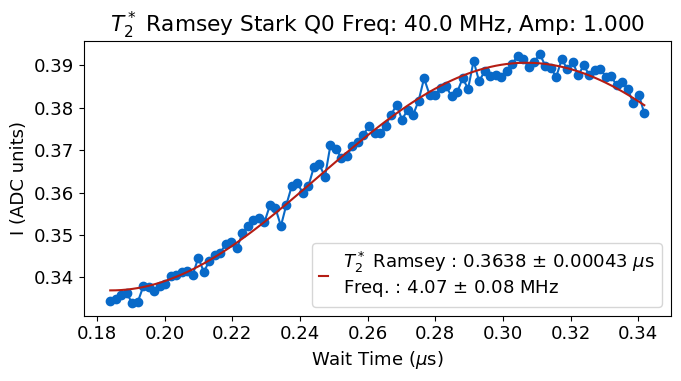

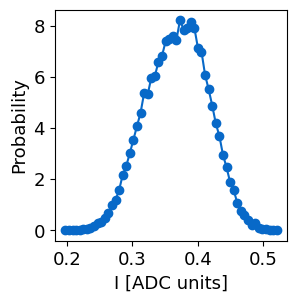

In [16]:
qi=0
t2_stark = meas.RamseyStarkExperiment(cfg_dict, qi=qi, params={'stark_gain':1,'df':40,'acStark':True,'ramsey_freq':0.1, 'expts':100})

### Create stark part of config file for tracking Gain-> Freq

In [ ]:
config.init_stark_section(cfg_dict['cfg_file'], 6)

{'aliases': {'soc': 'bf3_soc'},
 'device': {'qubit': {'T1': [115.45, 150, 150, 150, 150, 150],
   'T2e': [106.83, 300, 300, 300, 300, 300],
   'T2r': [15.58, 150, 150, 150, 150, 150],
   'f_ef': [3437.1538, 3800, 3800, 3800, 3800, 3800],
   'f_ge': [3585.2348, 4000, 4000, 4000, 4000, 4000],
   'kappa': [1.3467, 0, 0, 0, 0, 0],
   'low_gain': 0.003,
   'max_gain': 1,
   'pop': [0.0096, 0, 0, 0, 0, 0],
   'pulses': {'pi_ef': {'gain': [0.1384, 0.15, 0.15, 0.15, 0.15, 0.15],
     'phase': [0, 0, 0, 0, 0, 0],
     'sigma': [0.06, 0.1, 0.1, 0.1, 0.1, 0.1],
     'sigma_inc': [4, 5, 5, 5, 5, 5],
     'type': ['gauss', 'gauss', 'gauss', 'gauss', 'gauss', 'gauss']},
    'pi_ge': {'gain': [0.1736, 0.15, 0.15, 0.15, 0.15, 0.15],
     'phase': [0, 0, 0, 0, 0, 0],
     'sigma': [0.06, 0.1, 0.1, 0.1, 0.1, 0.1],
     'sigma_inc': [4, 4, 4, 4, 5, 5],
     'type': ['gauss', 'gauss', 'gauss', 'gauss', 'gauss', 'gauss']}},
   'spec_gain': [1, 1, 1, 1, 1, 1],
   'temp': [37.0571, 0, 0, 0, 0, 0],
   'tuned_

### Sweep frequency

In [44]:
qubit_list = np.arange(3)
qubit_list=[3]

gain = np.linspace(0.1,1,10)
for qi in qubit_list:
    for g in gain:
        t2rstark=meas.RamseyStarkFreqExperiment(cfg_dict, qi=qi, params={'step':1/430+0.001, 'stark_gain':g, 'start_df':30, 'end_df':150, 'expts_df':10})

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

KeyboardInterrupt: 

### Calibrate stark power positive freq

You'll want to adjust the step size / expts to capture the full frequency range 

Setting up a new session...


  0%|          | 0/12 [00:00<?, ?it/s]

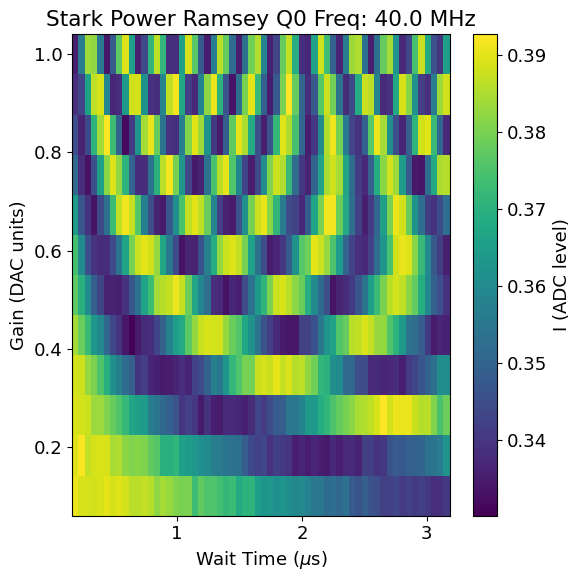

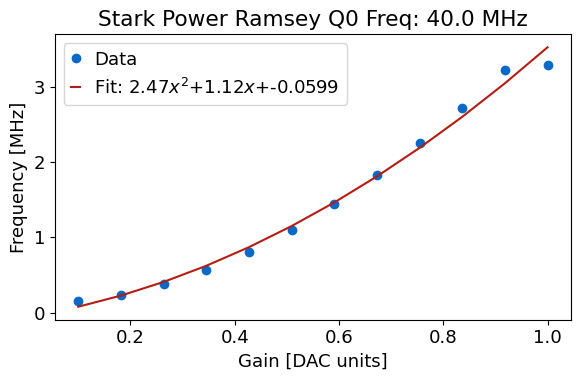

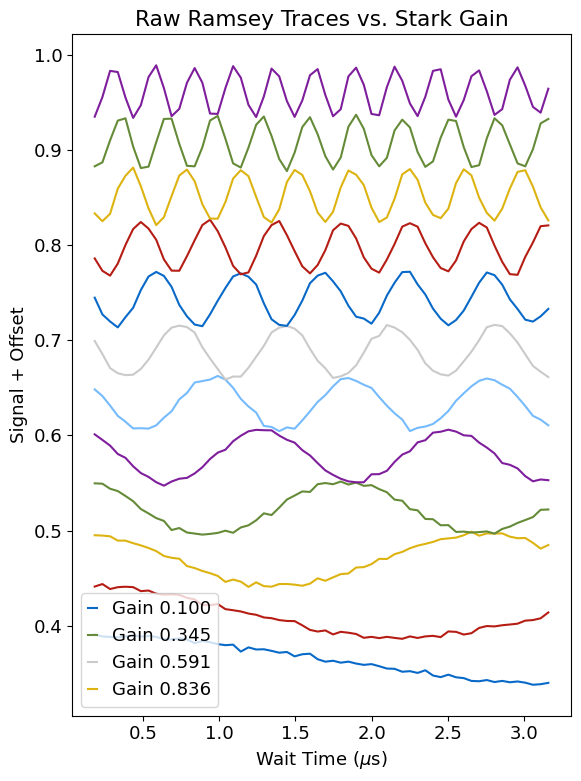

AttributeError: 'RamseyStarkPowerExperiment' object has no attribute 'cfg_file'

In [ ]:
qubit_list = np.arange(3)
qubit_list=[0]
d=[]
freqs= [40]
update=True
for f in freqs:
    for qi in qubit_list:
        params={'step':0.05, 'expts_gain':12, 'df':f, 'start_gain':0.1, 'end_gain':1,'expts':60, 'ramsey_freq':0.1}
        t2rstark=meas.RamseyStarkPowerExperiment(cfg_dict, qi=qi, params=params, live_plot=True)
        d.append(t2rstark)
        if update: t2rstark.update(neg=False)

In [ ]:
plt.figure()
for i in range(len(t2rstark.data['bin_centers'])):
    plt.plot(t2rstark.data['bin_centers'][i], t2rstark.data['hist'][i])

### Negative frequency

In [ ]:
#qubit_list = np.arange(3)
update=True 
qubit_list=[0]
for qi in qubit_list:
    params = {'step':0.05, 'expts_gain':12, 'df':-30, 'start_gain':0.1, 'end_gain':1, 'expts':70}
    t2rstark=meas.RamseyStarkPowerExperiment(cfg_dict, qi=qi, params=params, live_plot=True)
    if update: t2rstark.update(neg=True)
#handy.plot_many(d, title='Ramsey Stark', save_path=cfg_dict['expt_path'])

Setting up a new session...


Unexpected parameters found in params: {'end_gain', 'start_gain', 'stark_freq', 'expts_gain'}


  0%|          | 0/12 [00:00<?, ?it/s]

## T1

### Single exp

Unexpected parameters found in params: {'stark_freq'}
R2:0.961	Fit par error:0.104	 Best fit:b'avgi'


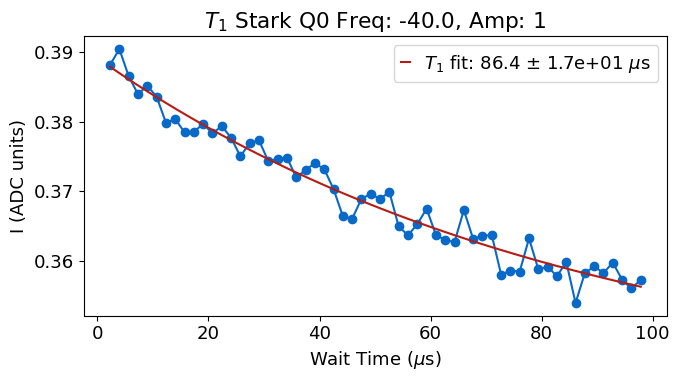

In [ ]:
qi=0
gain_list = [1]
for g in gain_list:
    params = {'stark_gain':g,'df':40,'expts':60, 'span':99}
    #params={'active_reset':False, 'df':200, 'stark_gain':g,'expts':300,'start':10,'span':0,'reps':1000}
    t1 = meas.T1StarkExperiment(cfg_dict, qi=qi, params=params) 

### Gain sweep

  0%|          | 0/10 [00:00<?, ?it/s]

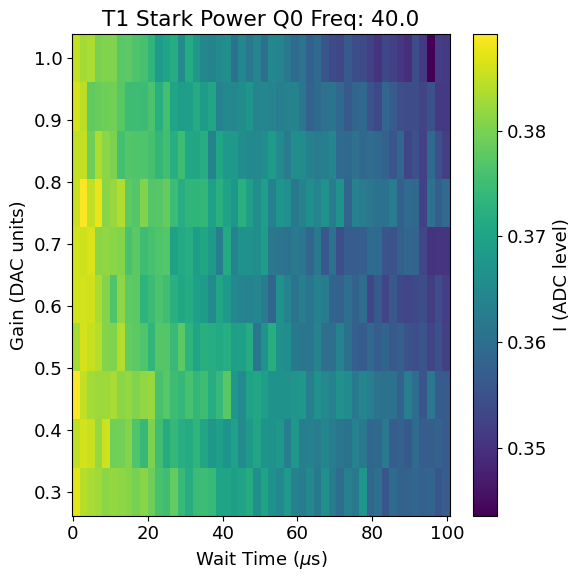

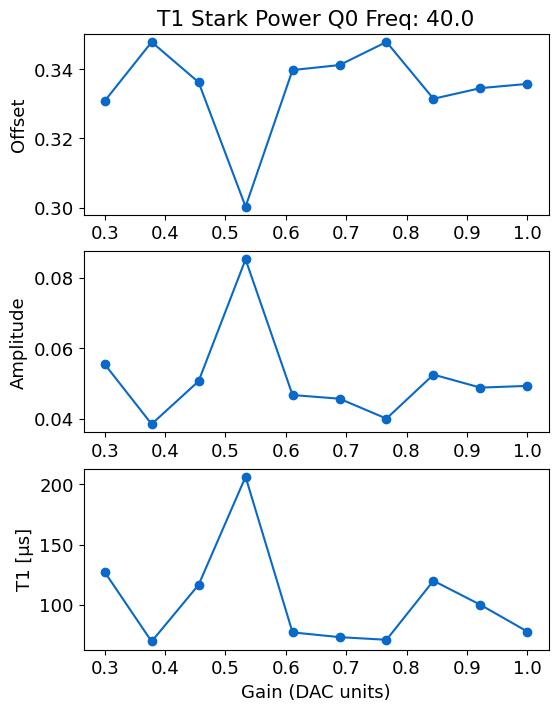

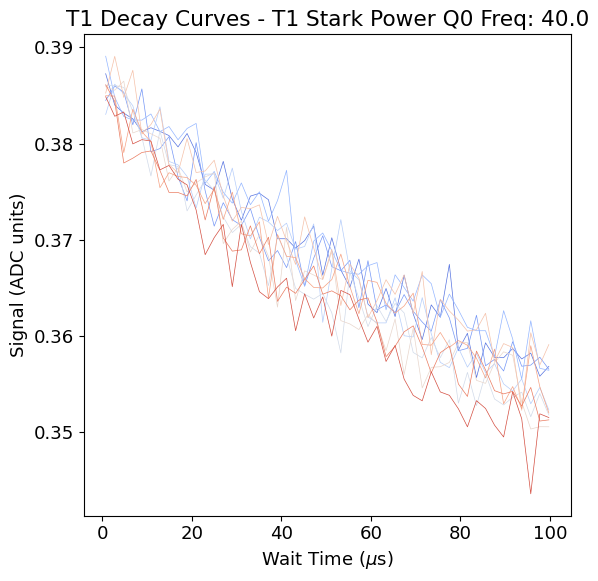

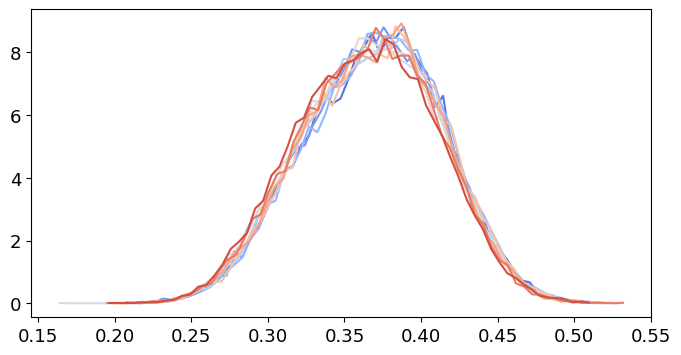

In [29]:
qubit_list = np.arange(3)
qubit_list=[0]
flist=[40]
for f in flist:
    for qi in qubit_list: 
        #t1_neg = meas.T1StarkPowerExperiment(cfg_dict, qi=qi, params={'df':-70,'start_gain':0.02,'end_gain':0.2,'start':3, 'rounds':4})
        params={'df':f,'start_gain':0.3,'end_gain':1,'start':0.2, 'rounds':1,'span':99,'expts_gain':10, 'expts':50}
        t1_pos = meas.T1StarkPowerExperiment(cfg_dict, qi=qi, params=params) 
        plt.figure()
        for i in range(len(t1_pos.data['bin_centers'])):
            plt.plot(t1_pos.data['bin_centers'][i], t1_pos.data['hist'][i])

### Freq sweep

In [ ]:
t1_freq = meas.T1StarkFreqExperiment(cfg_dict, qi=19, params={'span':6, 'span_f':100, 'start_df':50, 'expts_f':100})

### Single evo point linear gain sweep

In [33]:
t1_cont = meas.T1StarkPowerSingle(cfg_dict, qi=0, params={"rounds":1, 'wait_time':99, 'expts':100})

Unexpected parameters found in params: {'stark_freq'}


  0%|          | 0/150000 [00:00<?, ?it/s]

RuntimeError: Pulse length of 246932 cycles exceeds the max of 2**16 - use multiple pulses or a periodic pulse?

In [37]:
t1_quad = meas.T1StarkPowerQuadSingle(cfg_dict, qi=0, params={"rounds":1, 'wait_time':99, 'expts':100, "stop_f":1})

Traceback (most recent call last):
  File "_pydevd_bundle\\pydevd_cython.pyx", line 1609, in _pydevd_bundle.pydevd_cython.handle_exception
  File "c:\Users\circu\anaconda3\envs\qick_calib\Lib\site-packages\debugpy\_vendored\pydevd\pydevd.py", line 2185, in do_wait_suspend
    keep_suspended = self._do_wait_suspend(thread, frame, event, arg, trace_suspend_type, from_this_thread, frames_tracker)
                     ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\circu\anaconda3\envs\qick_calib\Lib\site-packages\debugpy\_vendored\pydevd\pydevd.py", line 2254, in _do_wait_suspend
    notify_event.wait(wait_timeout)
  File "c:\Users\circu\anaconda3\envs\qick_calib\Lib\threading.py", line 655, in wait
    signaled = self._cond.wait(timeout)
               ^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\circu\anaconda3\envs\qick_calib\Lib\threading.py", line 359, in wait
    gotit = waiter.acquire(True, timeout)
            ^^

TypeError: unsupported operand type(s) for +: 'float' and 'NoneType'